In [1]:
from pandas_plink import read_grm
from pandas_plink import get_data_folder
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import *
%matplotlib inline
import umap
import pandas as pd
from sklearn.manifold import *
from sklearn.decomposition import PCA, KernelPCA
import warnings
warnings.filterwarnings('ignore')

In [18]:
filepath = '../spss_gwas2/grm/Caucasians/SPSS.QC.impute2_plink2.allfiles.king_mind1_maf01_geno05.Caucasian.grm.bin'
id_filepath = '../spss_gwas2/grm/Caucasians/SPSS.QC.impute2_plink2.allfiles.king_mind1_maf01_geno05.Caucasian.grm.id'
n_snp_filepath = '../spss_gwas2/grm/Caucasians/SPSS.QC.impute2_plink2.allfiles.king_mind1_maf01_geno05.Caucasian.grm.N.bin'
(K, n_snps) = read_grm(filepath, id_filepath, n_snp_filepath)

df = K.to_pandas()
patient_ID = np.array(df.index)

# Dimensionality reduction on Caucasian cases

In [3]:
sc = StandardScaler()
data = sc.fit_transform(np.array(df))
data_raw = np.array(df)

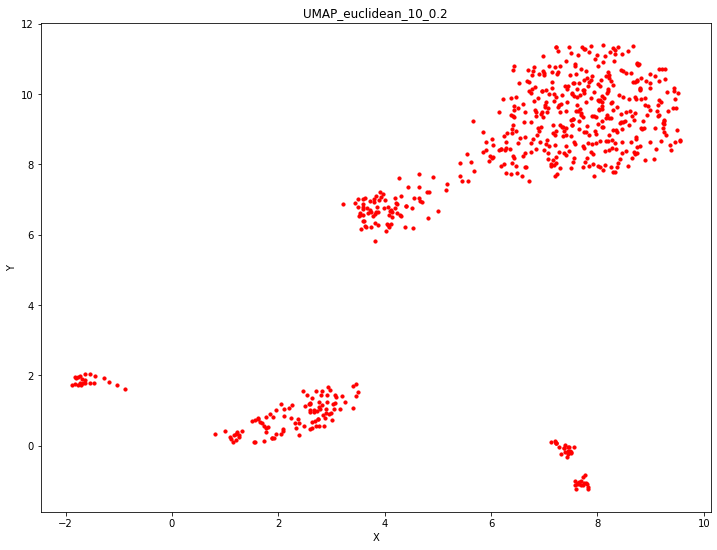

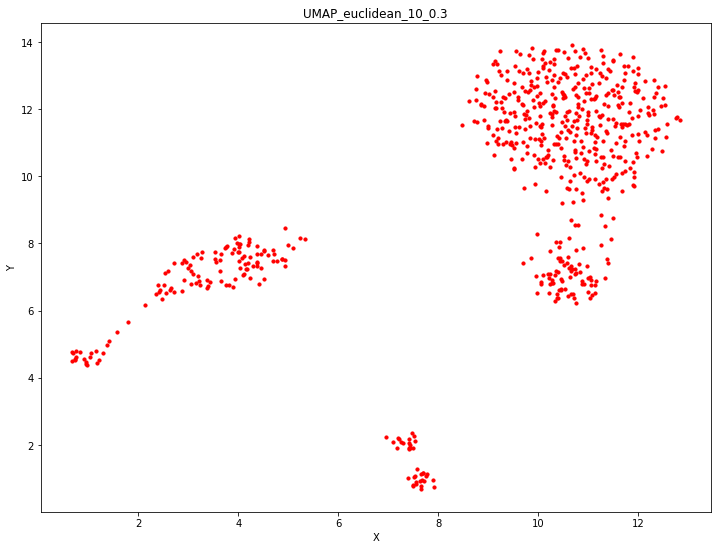

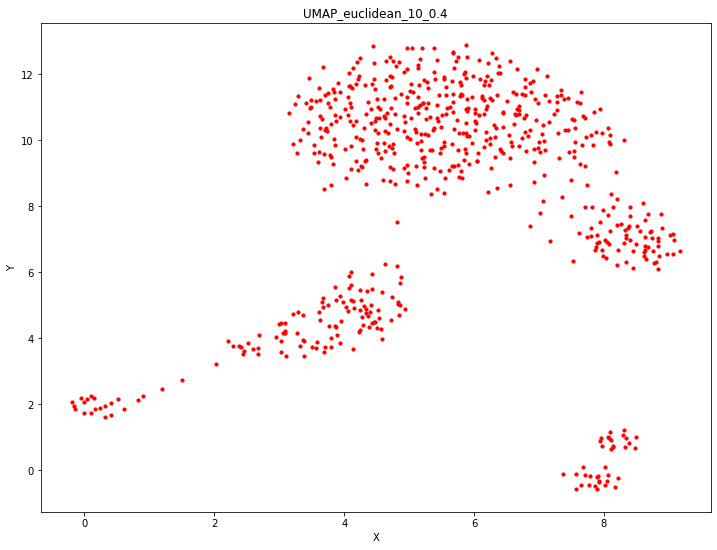

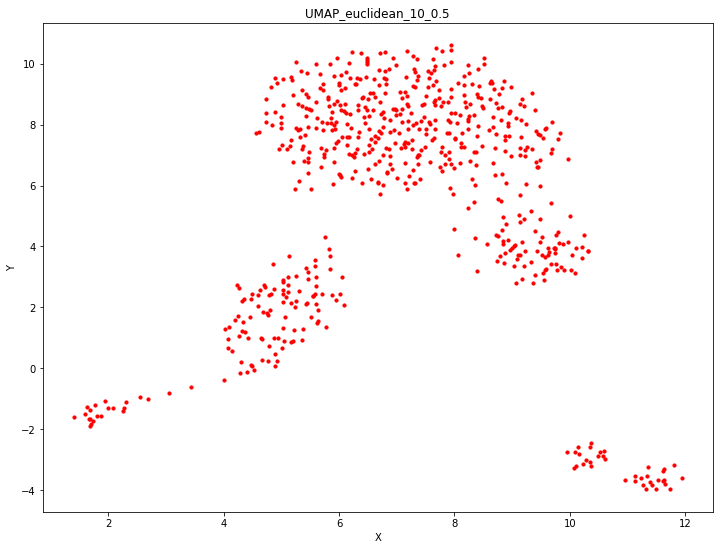

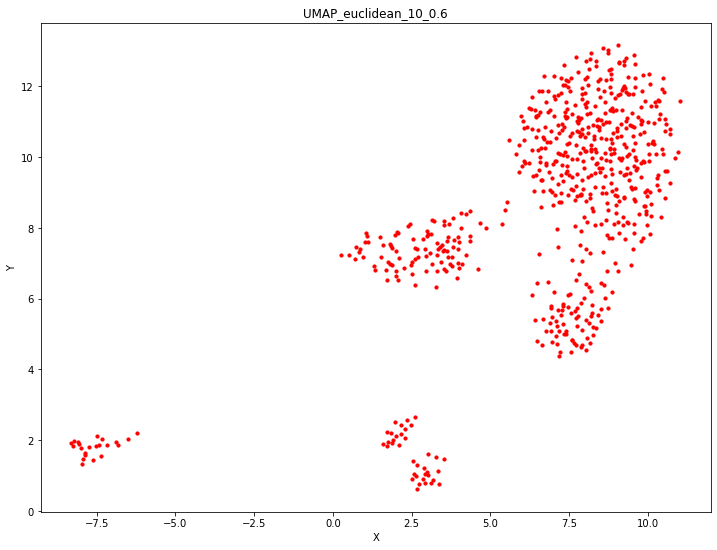

...

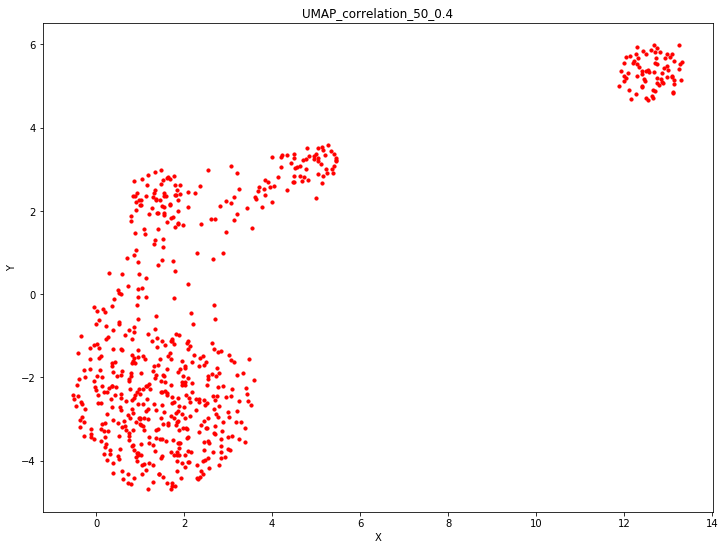

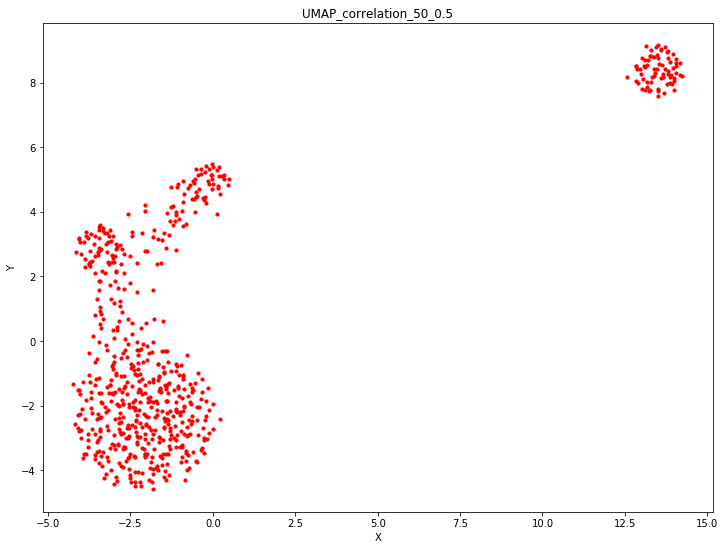

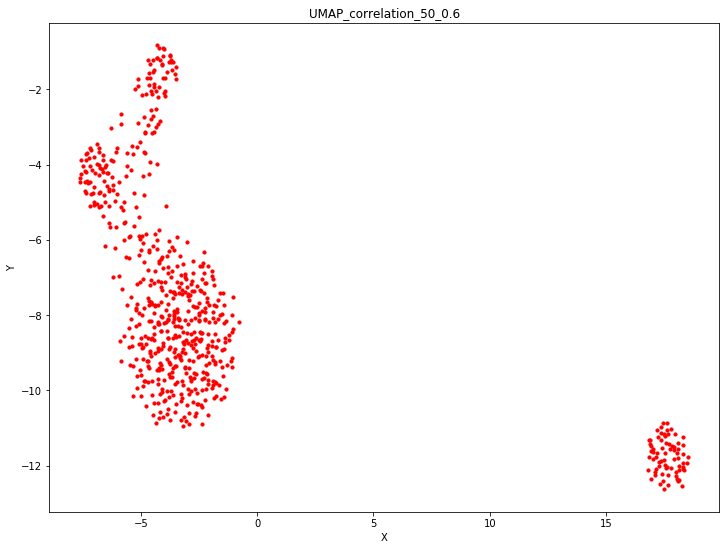

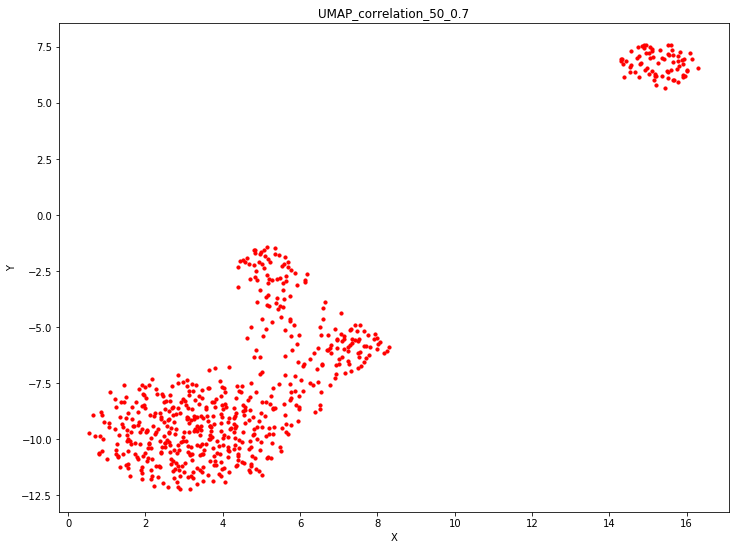

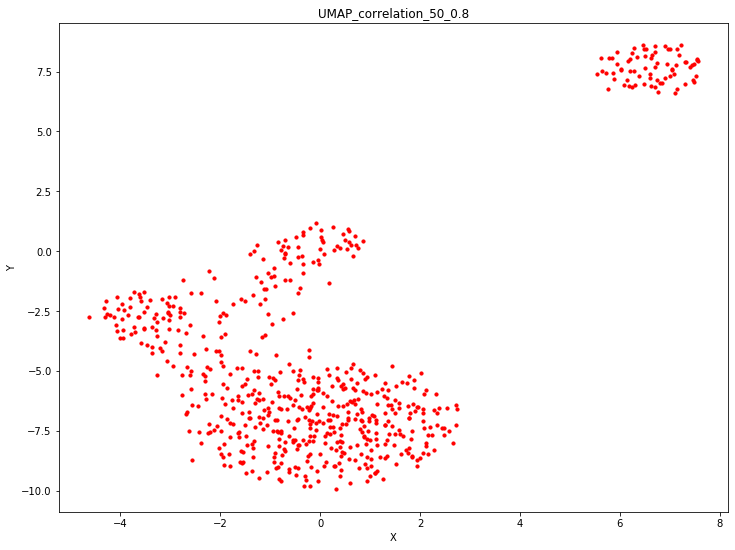

In [4]:
#UMAP
for metric in ['euclidean', 'cosine','correlation']:
    for n_neighbors in range(10, 60, 10):
        for min_dist in np.arange(0.2, 0.8, 0.1):
            embedding = umap.UMAP(n_components=2, n_neighbors=n_neighbors, 
                                  min_dist=min_dist, random_state=42, metric=metric)
            data_umap = embedding.fit_transform(data)
            fig = plt.figure(figsize=(12,9))
            plt.scatter(data_umap[:, 0], data_umap[:, 1], s=10, c='r')
            plt.title('UMAP_{}_{}_{}'.format(metric, str(n_neighbors), str(round(min_dist,2))))
            plt.xlabel('X')
            plt.ylabel('Y')
            np.save('./spss_gwas2/All/UMAP_{}_{}_{}'
                    .format(metric, str(n_neighbors), str(round(min_dist,2))), data_umap)

## Linear PCA

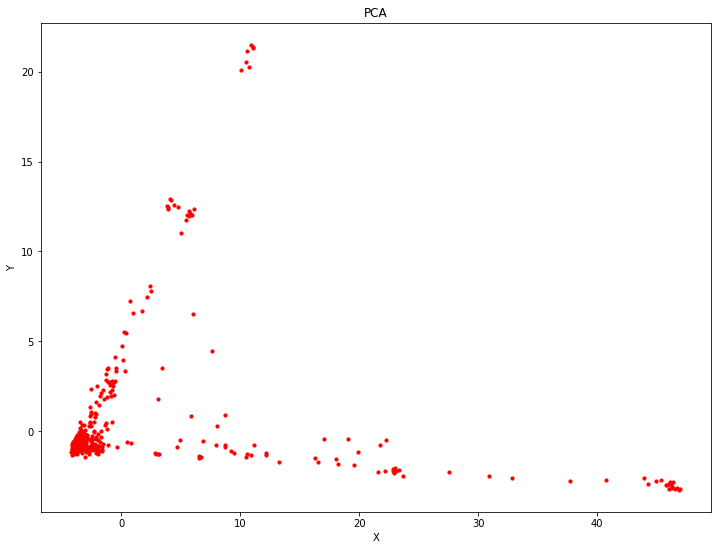

In [5]:
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data)
fig = plt.figure(figsize=(12,9))
plt.scatter(data_pca[:, 0], data_pca[:, 1], s=10, c='r')
plt.title('PCA')
plt.xlabel('X')
plt.ylabel('Y')
np.save('./spss_gwas2/All/PCA.npy',data_pca)

## Kernel PCA

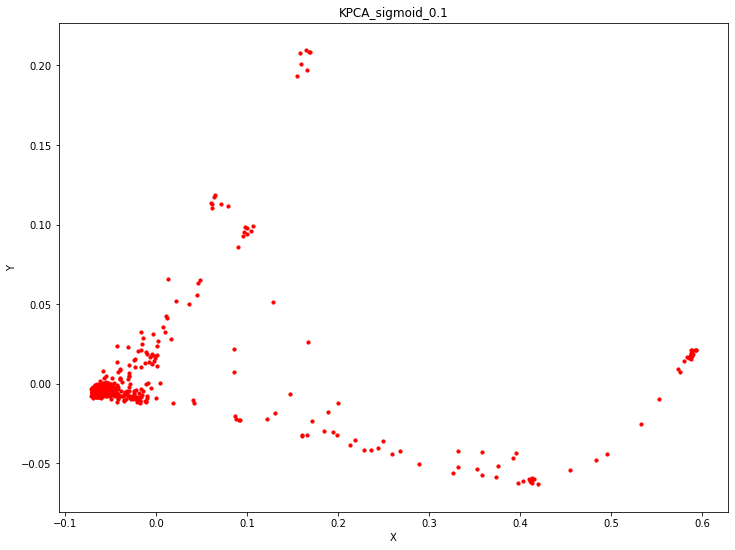

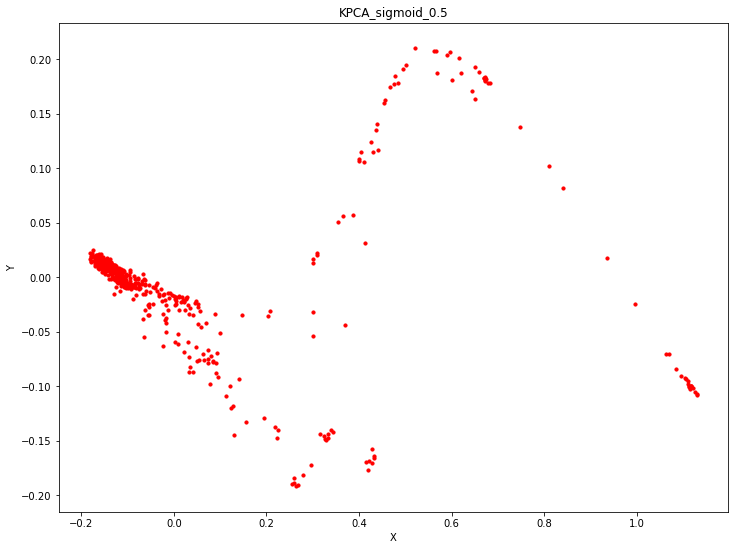

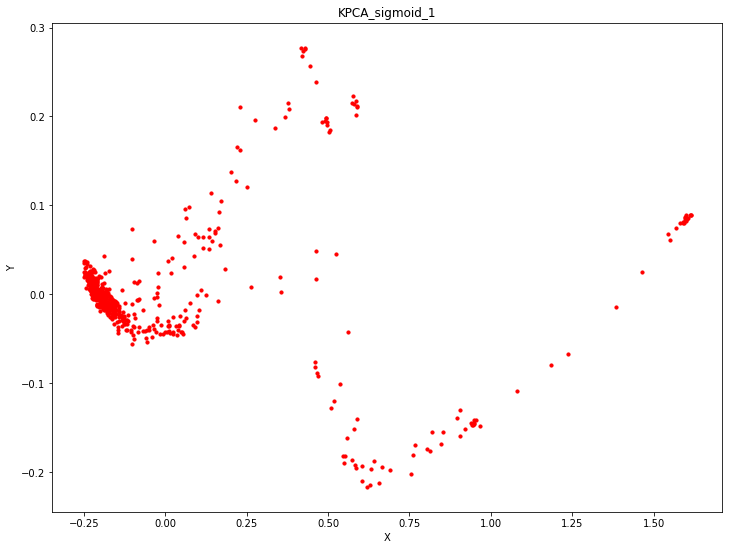

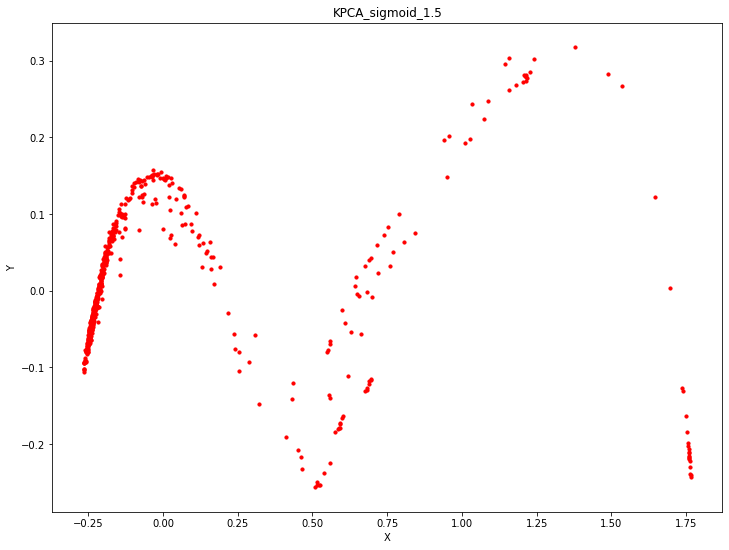

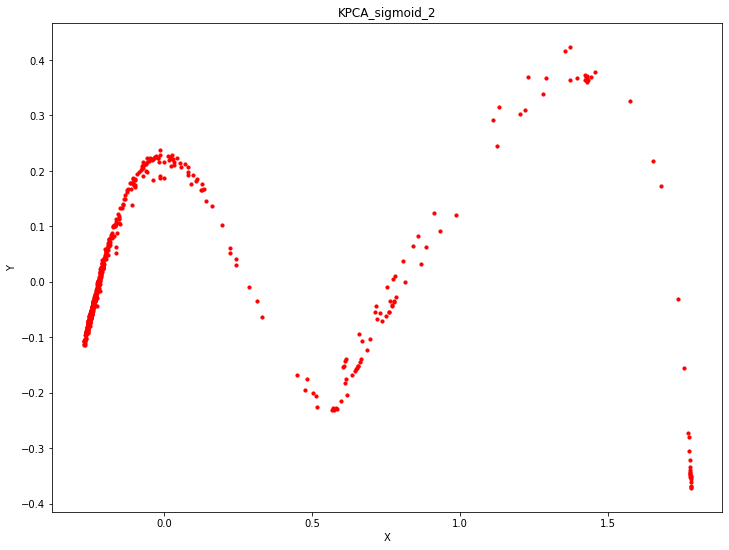

...

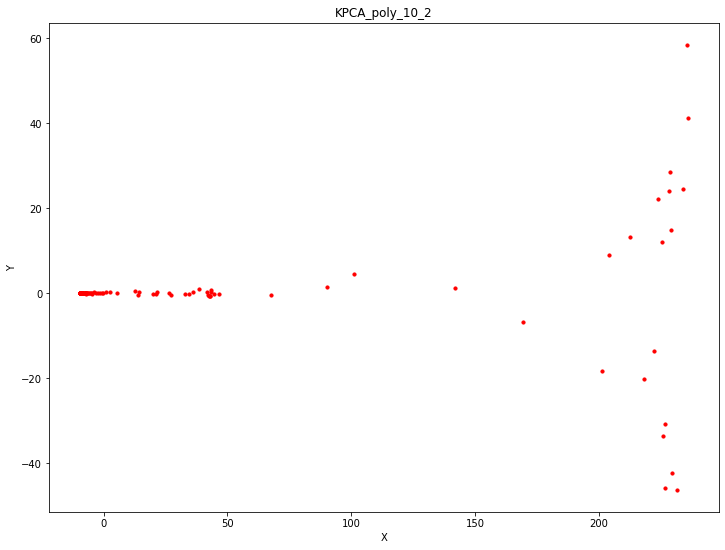

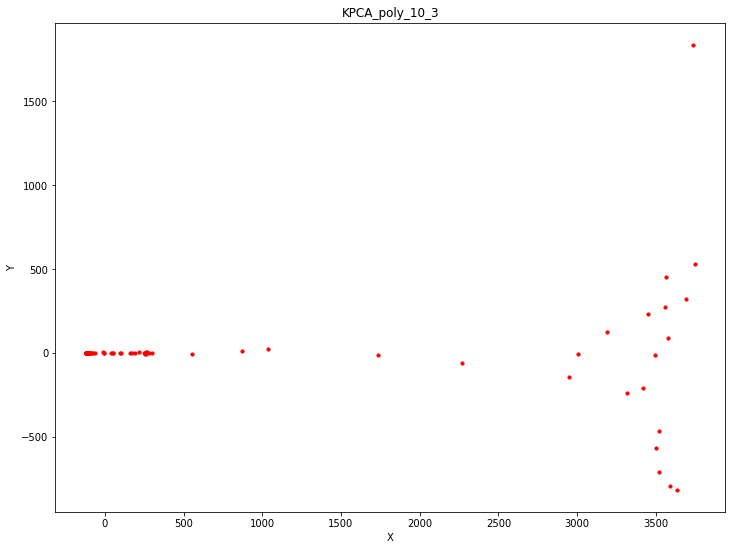

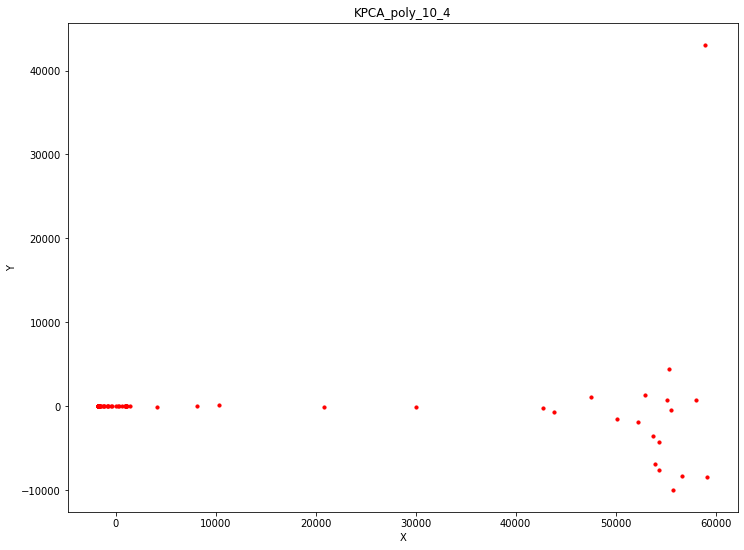

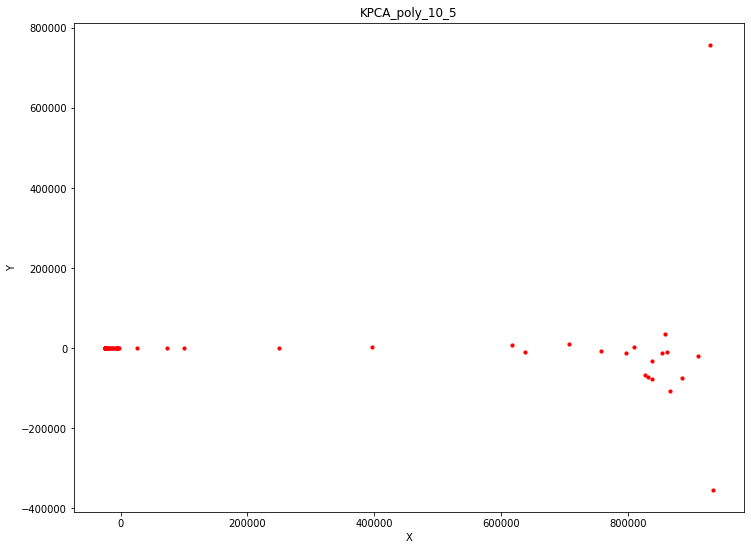

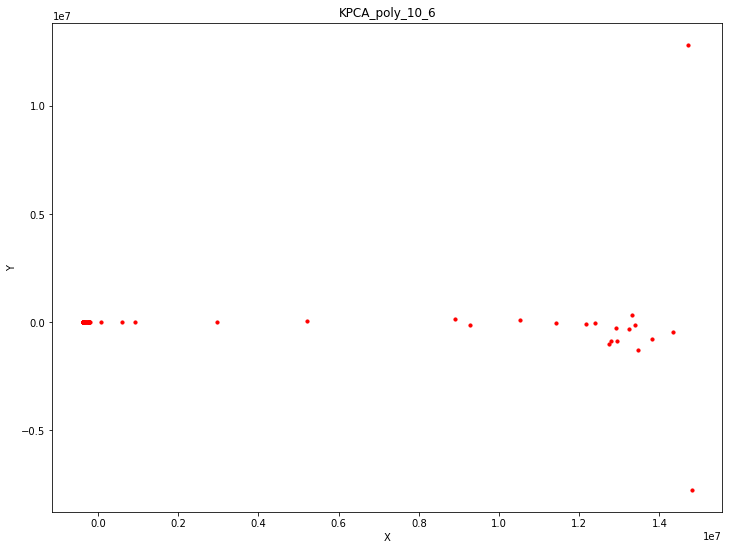

In [6]:
# use data w or w/o scaling?
kpca = KernelPCA(kernel='sigmoid', degree=1, gamma=5, n_components=2)
data_kpca = kpca.fit_transform(data)
for kernel in ['sigmoid', 'rbf','poly']:
    for gamma in [0.1, 0.5, 1, 1.5, 2, 5, 10]:
        if kernel == 'poly':
            for degree in range(2,7):
                kpca = KernelPCA(kernel=kernel, degree=degree, gamma=gamma, n_components=2)
                data_kpca = kpca.fit_transform(data_raw)
                fig = plt.figure(figsize=(12,9))
                plt.scatter(data_kpca[:, 0], data_kpca[:, 1], s=10, c='r')
                plt.title('KPCA_{}_{}_{}'.format(kernel, str(gamma), str(degree)))
                plt.xlabel('X')
                plt.ylabel('Y')
                np.save('./spss_gwas2/Caucasians/KPCA_{}_{}_{}'
                        .format(kernel, str(gamma), str(degree)), data_kpca)
        else:
            kpca = KernelPCA(kernel=kernel,gamma=gamma, n_components=2)
            data_kpca = kpca.fit_transform(data_raw)
            fig = plt.figure(figsize=(12,9))
            plt.scatter(data_kpca[:, 0], data_kpca[:, 1], s=10, c='r')
            plt.title('KPCA_{}_{}'.format(kernel, str(gamma)))
            plt.xlabel('X')
            plt.ylabel('Y')
            np.save('./spss_gwas2/All/KPCA_{}_{}'
                    .format(kernel, str(gamma)), data_kpca)


## t-SNE

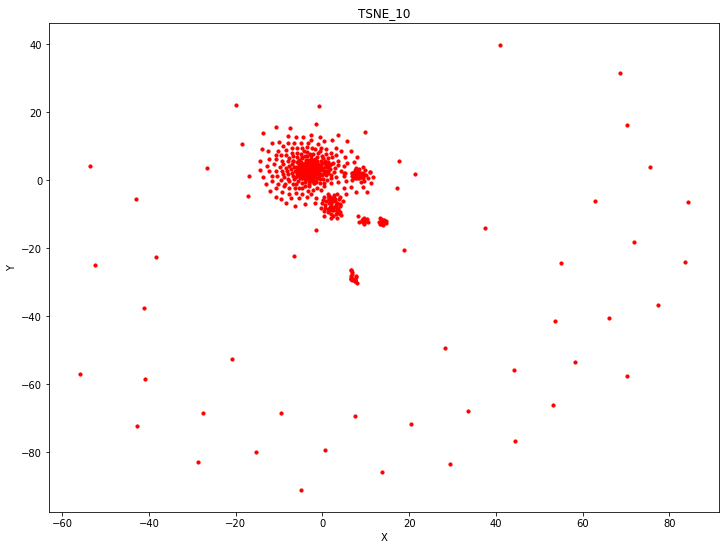

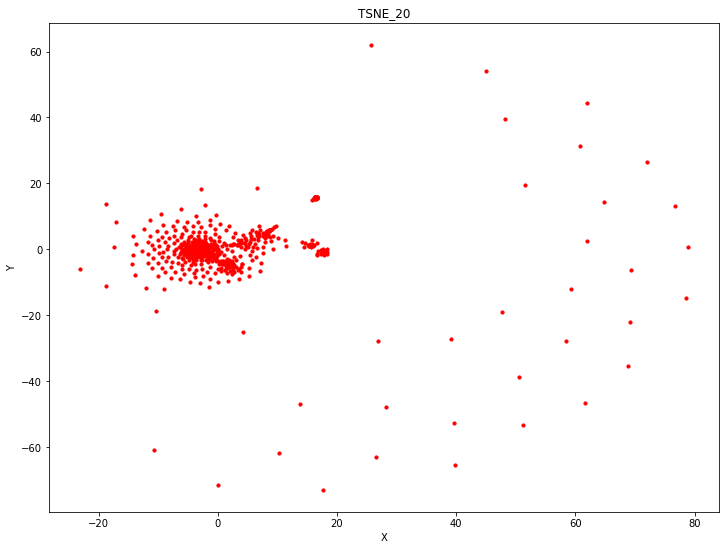

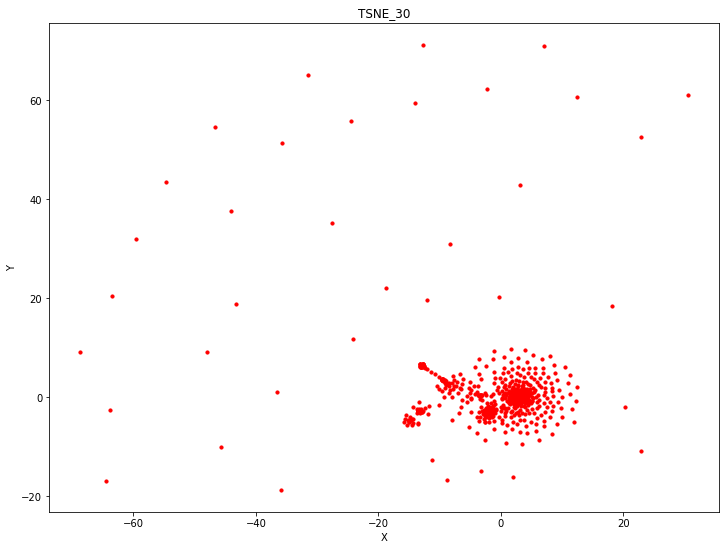

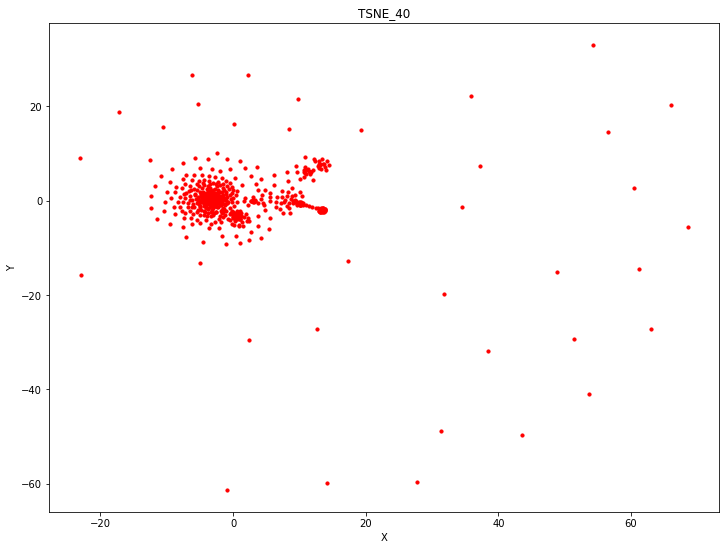

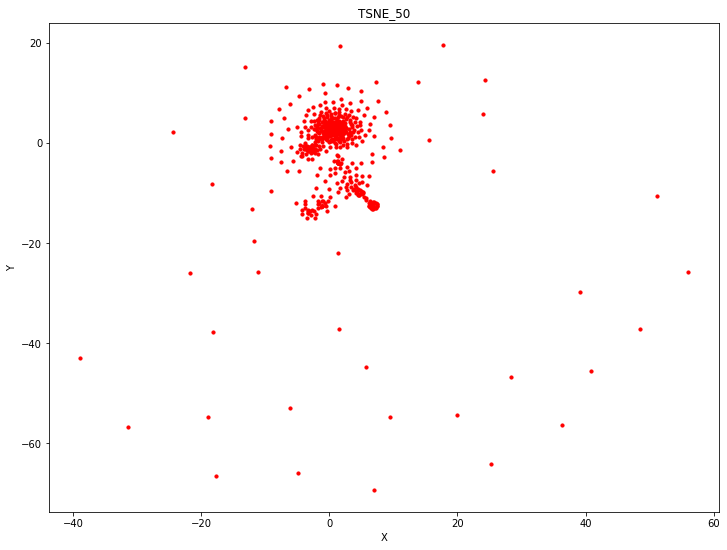

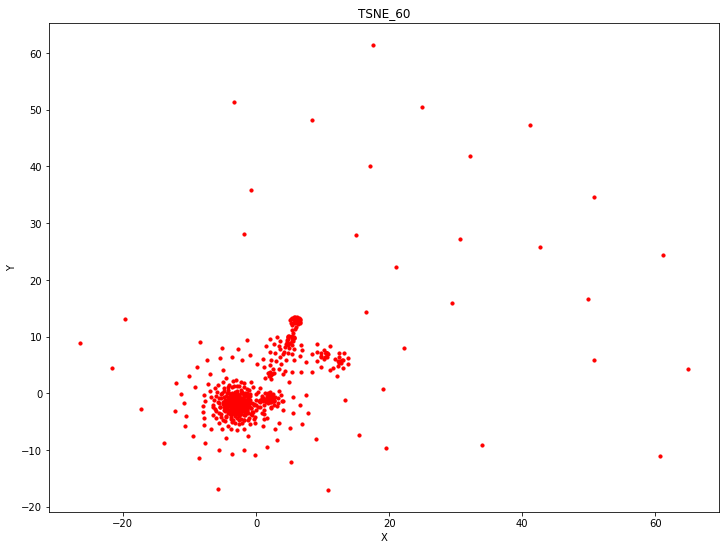

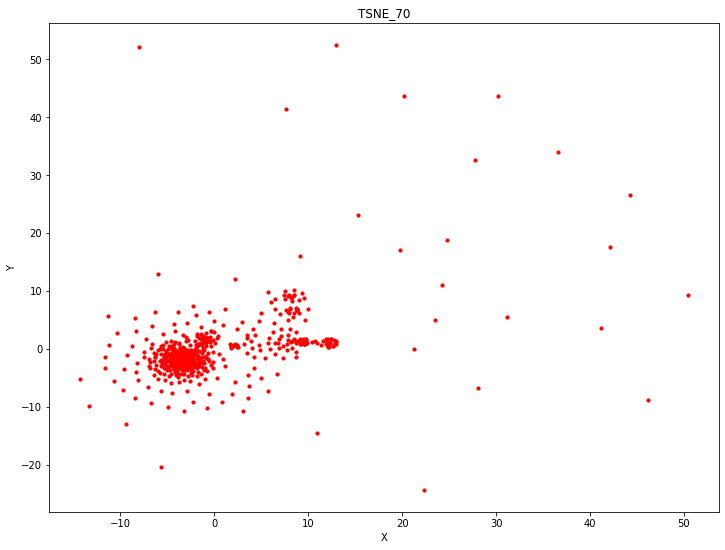

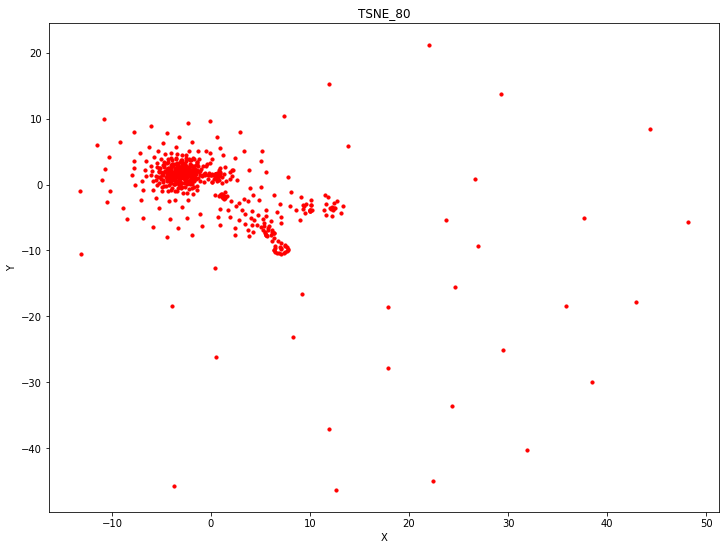

In [7]:
for perplexity in range(10, 90, 10):
    tsne = TSNE(n_components=2, perplexity=perplexity)
    data_tsne = tsne.fit_transform(data)
    fig = plt.figure(figsize=(12,9))
    plt.scatter(data_tsne[:, 0], data_tsne[:, 1], s=10, c='r')
    plt.title('TSNE_{}'.format(str(perplexity)))
    plt.xlabel('X')
    plt.ylabel('Y')
    np.save('./spss_gwas2/All/TSNE_{}'
            .format(str(perplexity)), data_tsne)

## Isomap

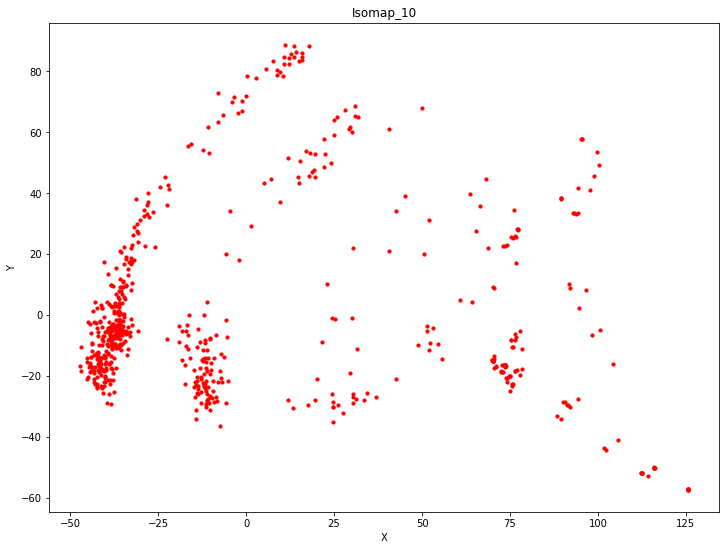

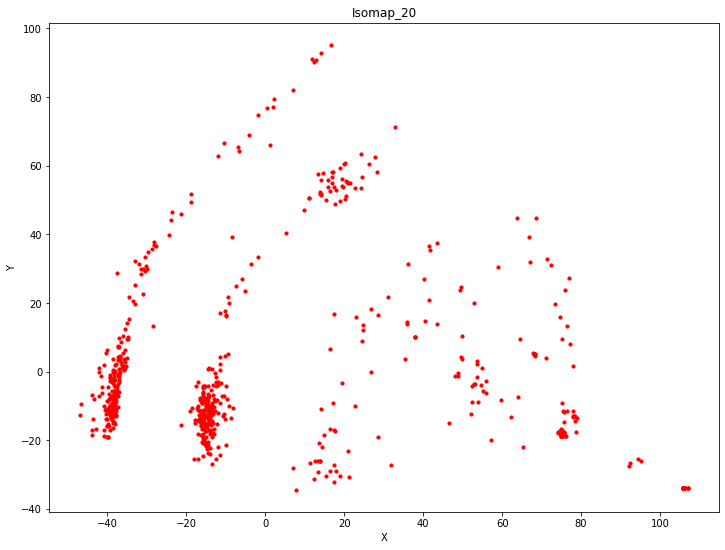

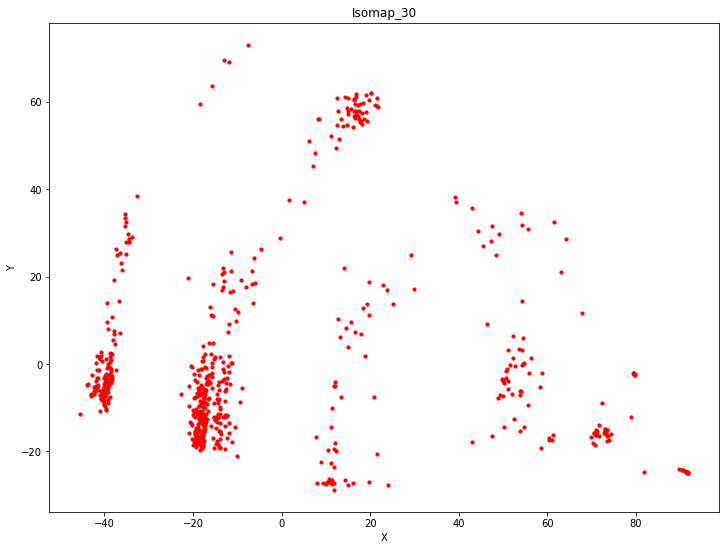

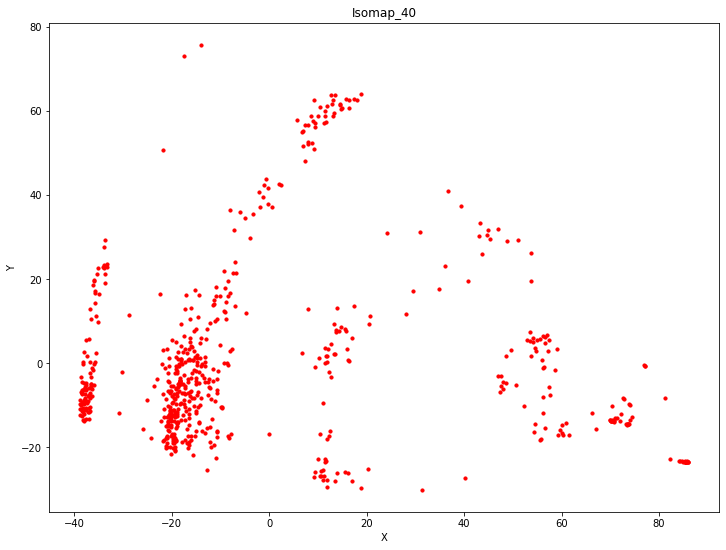

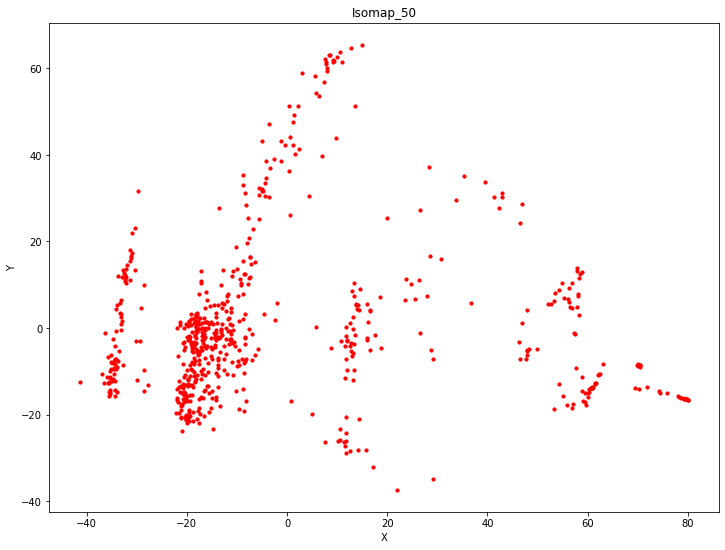

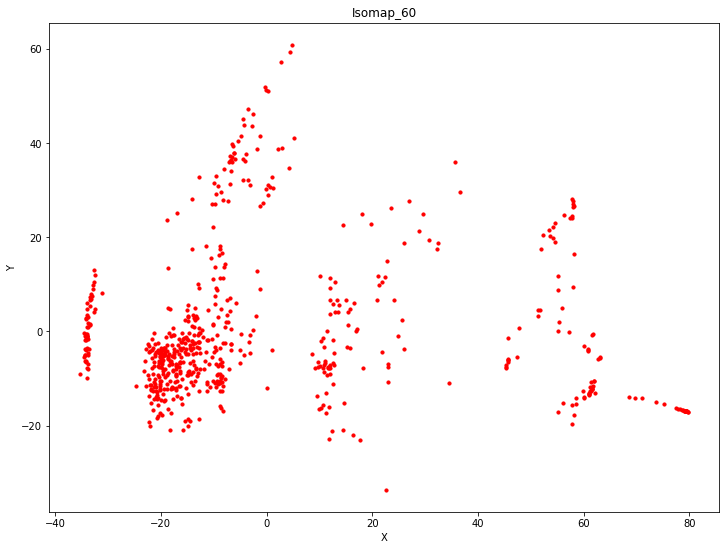

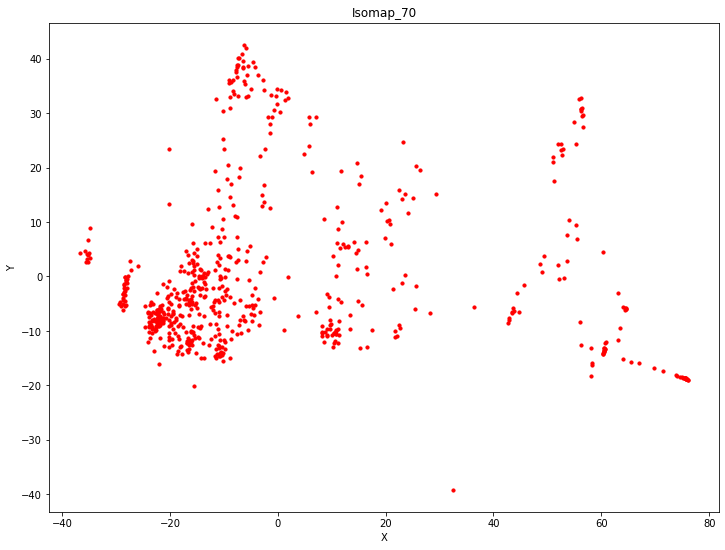

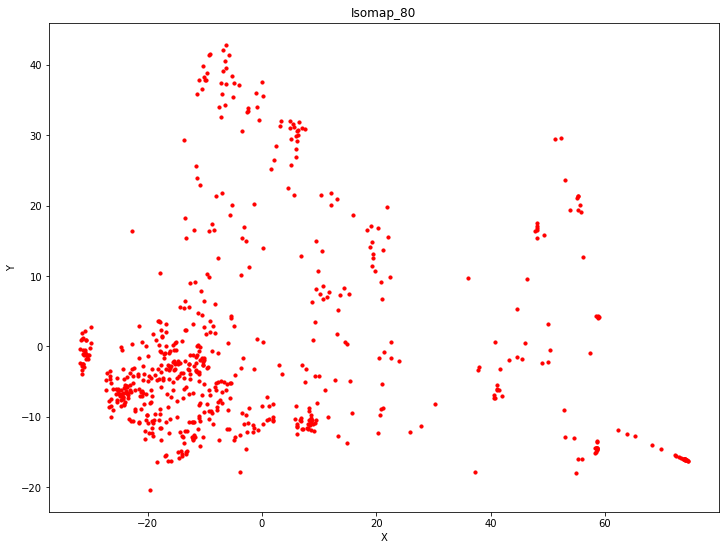

In [8]:
for n_neighbors in range(10, 90, 10):
    isomap = Isomap(n_neighbors=n_neighbors,n_components=2)
    data_isomap = isomap.fit_transform(data)
    fig = plt.figure(figsize=(12,9))
    plt.scatter(data_isomap[:, 0], data_isomap[:, 1], s=10, c='r')
    plt.title('Isomap_{}'.format(str(n_neighbors)))
    plt.xlabel('X')
    plt.ylabel('Y')
    np.save('./spss_gwas2/All/Isomap_{}'
            .format(str(n_neighbors)), data_isomap)

## LLE

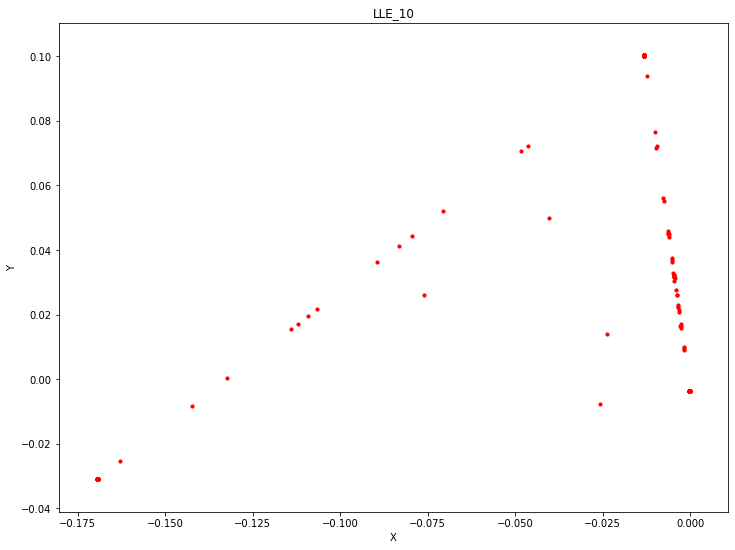

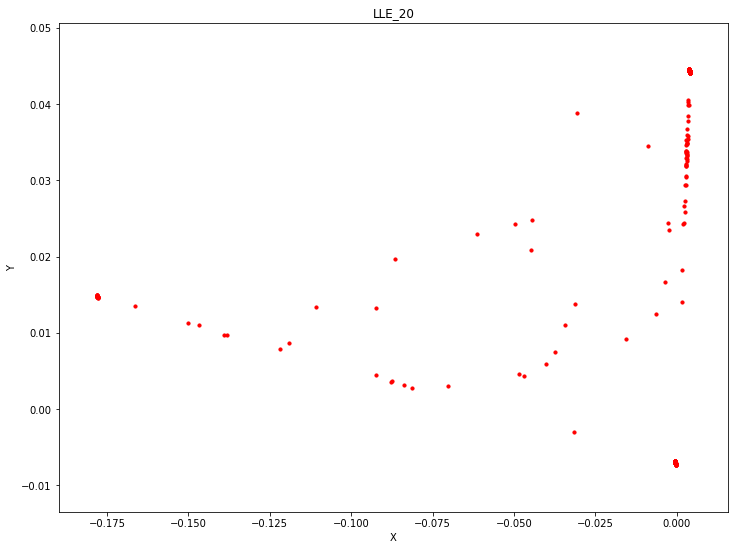

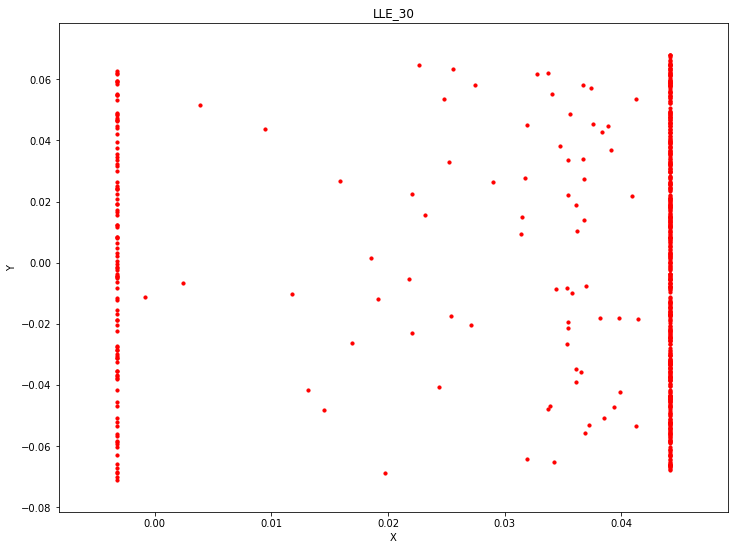

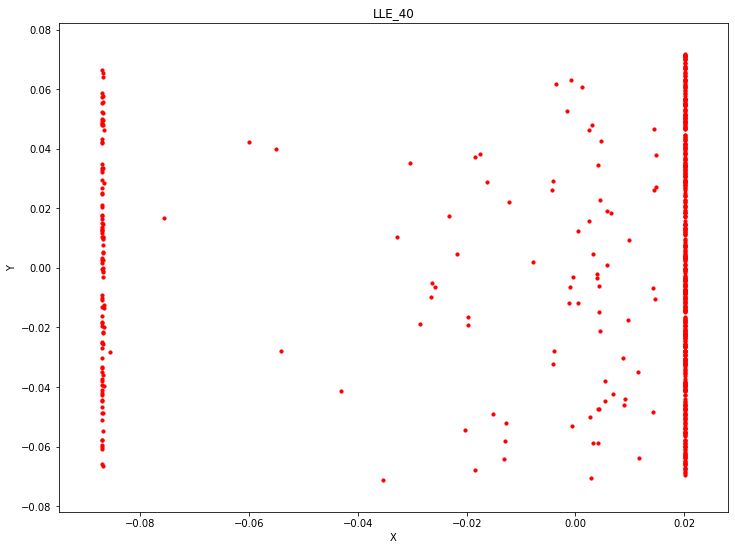

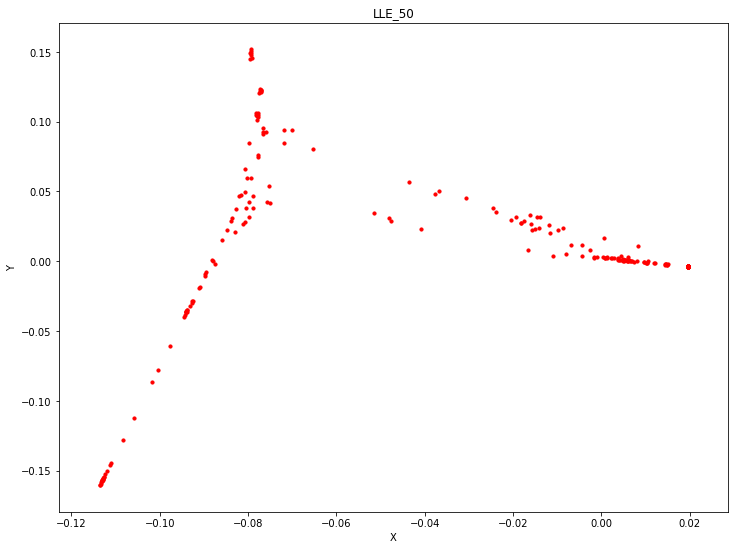

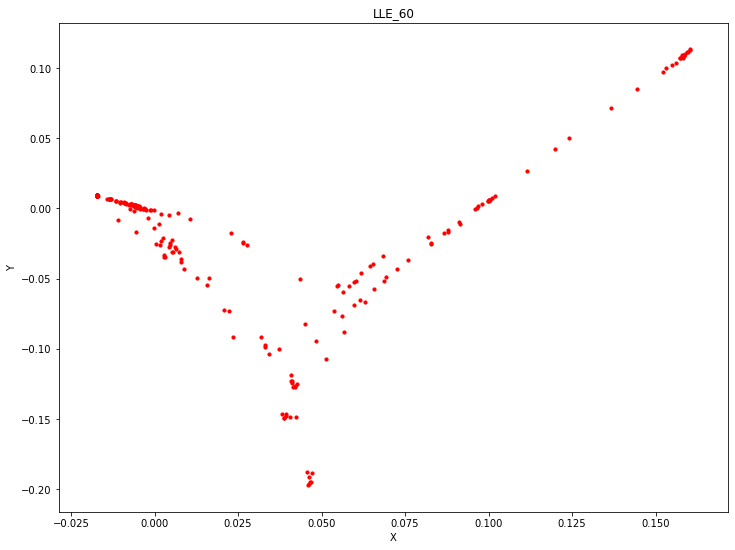

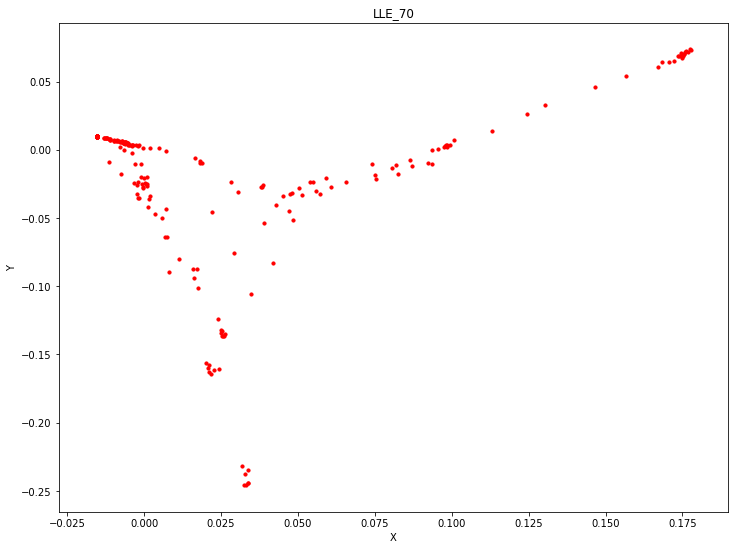

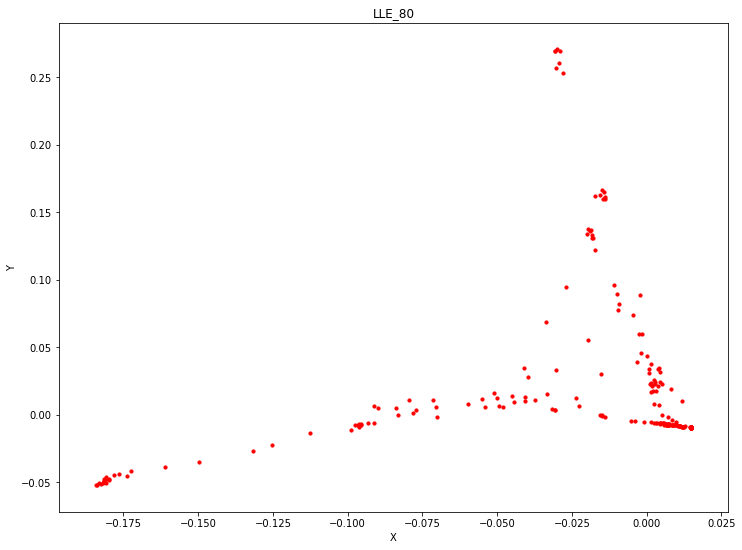

In [9]:
for n_neighbors in range(10, 90, 10):
    lle = LocallyLinearEmbedding(n_neighbors=n_neighbors,n_components=2)
    data_lle = lle.fit_transform(data)
    fig = plt.figure(figsize=(12,9))
    plt.scatter(data_lle[:, 0], data_lle[:, 1], s=10, c='r')
    plt.title('LLE_{}'.format(str(n_neighbors)))
    plt.xlabel('X')
    plt.ylabel('Y')
    np.save('./spss_gwas2/All/LLE_{}'
            .format(str(n_neighbors)), data_lle)

## PCA +UMAP

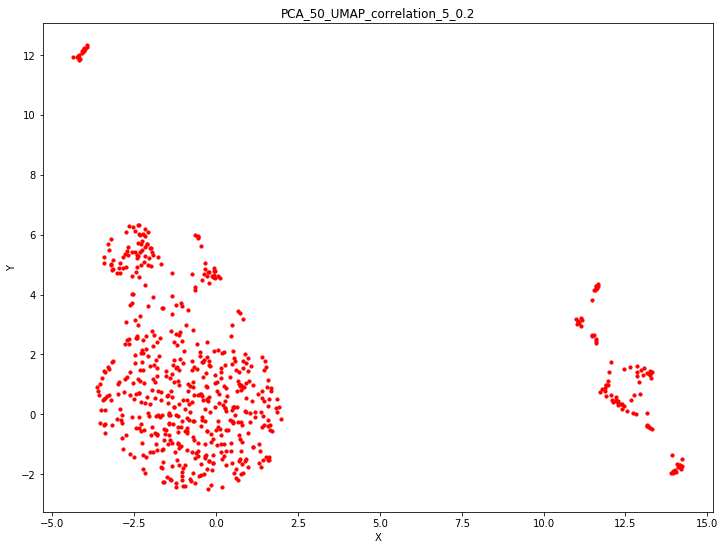

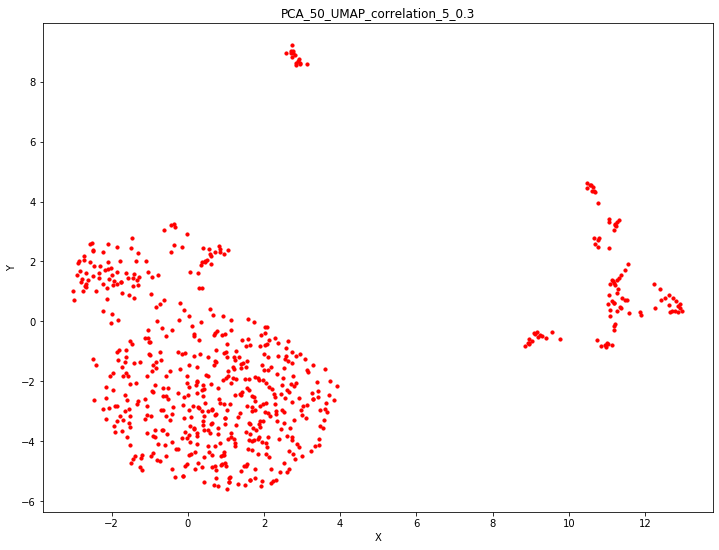

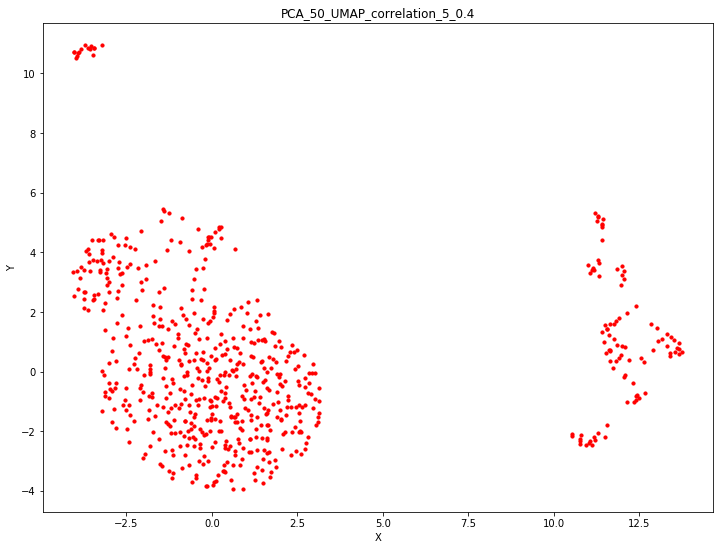

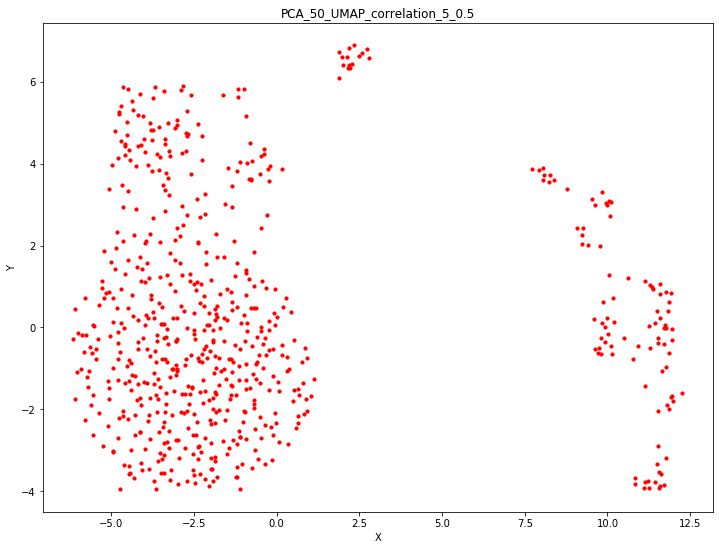

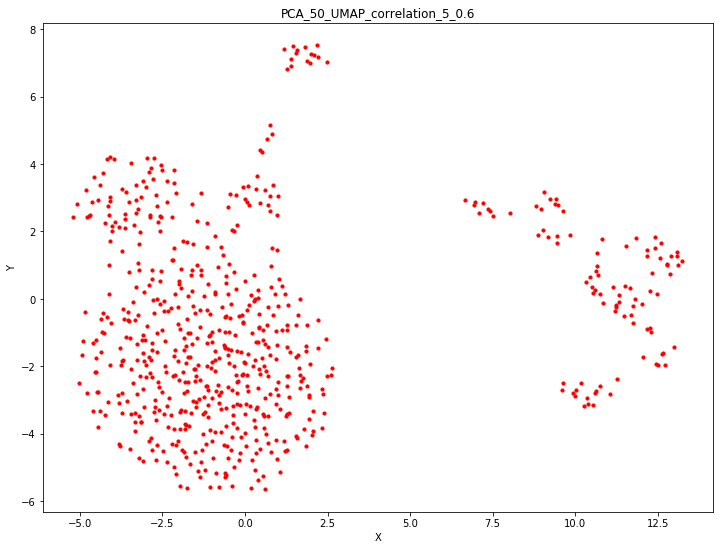

...

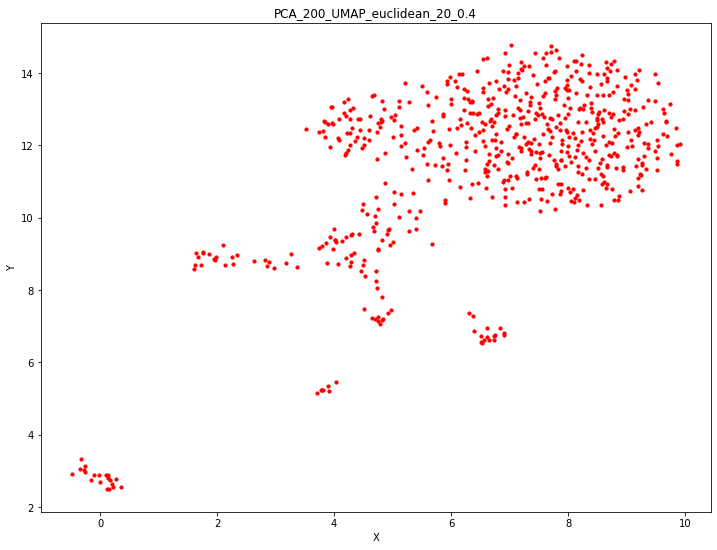

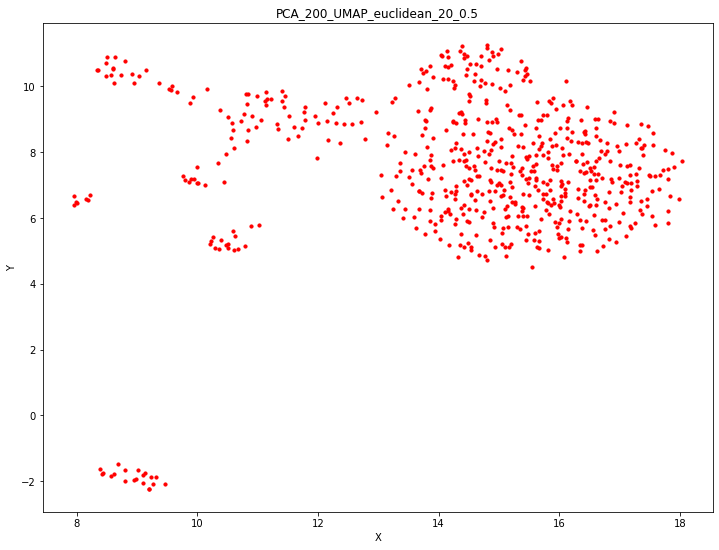

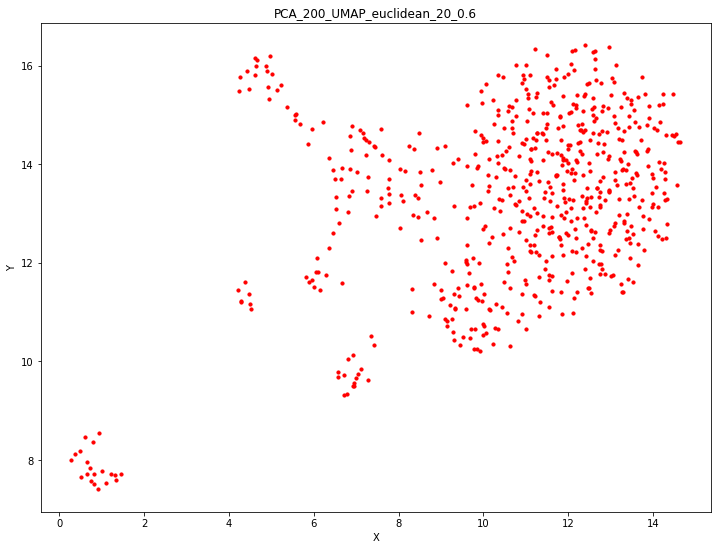

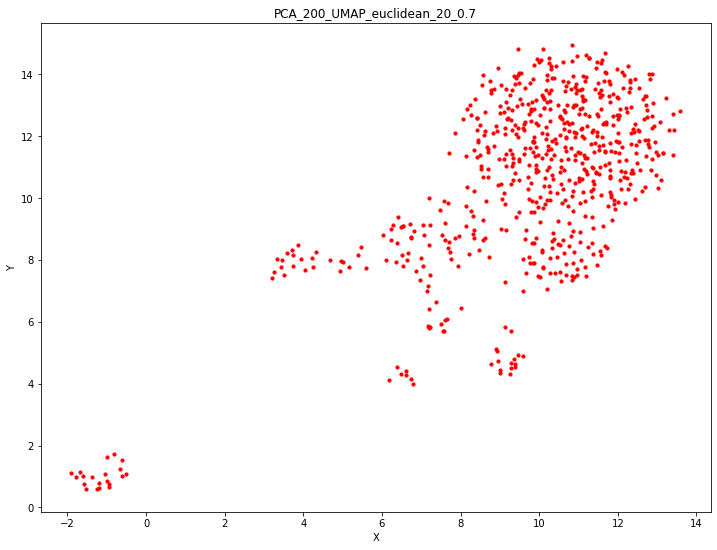

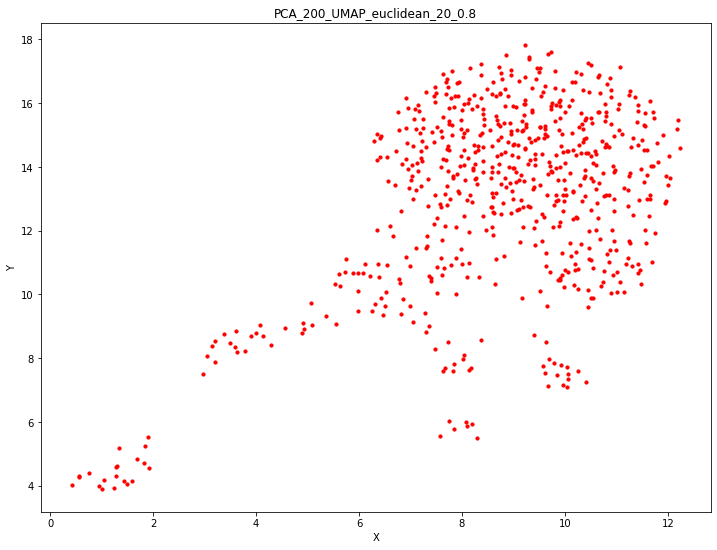

In [10]:
for n_components in range(50, 201, 50):
    pca = PCA(n_components=n_components)
    data_pca = pca.fit_transform(data)
    for metric in ['correlation','euclidean']:
        for n_neighbors in range(5, 21, 5):
            for min_dist in np.arange(0.2, 0.8, 0.1):
                embedding = umap.UMAP(n_components=2, n_neighbors=n_neighbors, 
                                      min_dist=min_dist, random_state=42, metric=metric)
                data_umap = embedding.fit_transform(data_pca)
                fig = plt.figure(figsize=(12,9))
                plt.scatter(data_umap[:, 0], data_umap[:, 1], s=10, c='r')
                plt.title('PCA_{}_UMAP_{}_{}_{}'
                          .format(str(n_components),metric, str(n_neighbors), str(round(min_dist,2))))
                plt.xlabel('X')
                plt.ylabel('Y')
                np.save('./spss_gwas2/All/PCA_{}_UMAP_{}_{}_{}'
                        .format(str(n_components),metric, str(n_neighbors), str(round(min_dist,2))), data_umap)
    

## PCA + TSNE

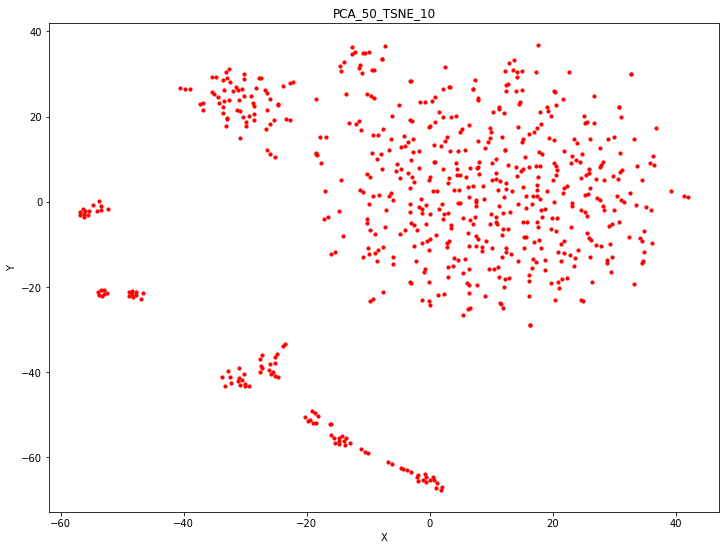

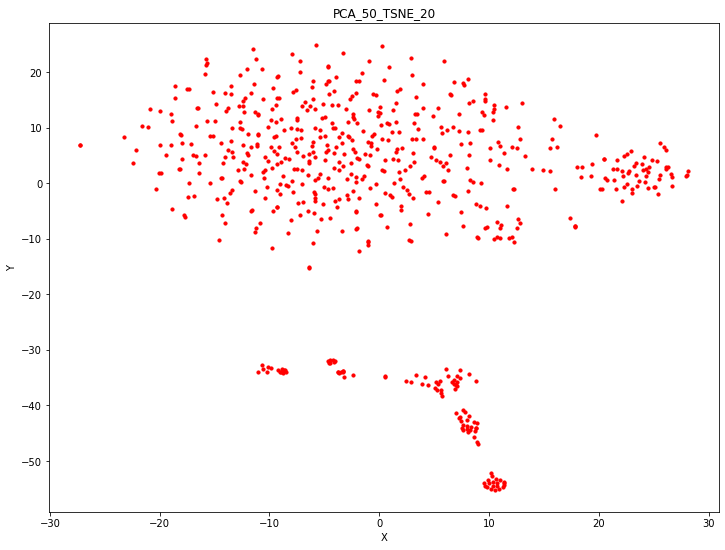

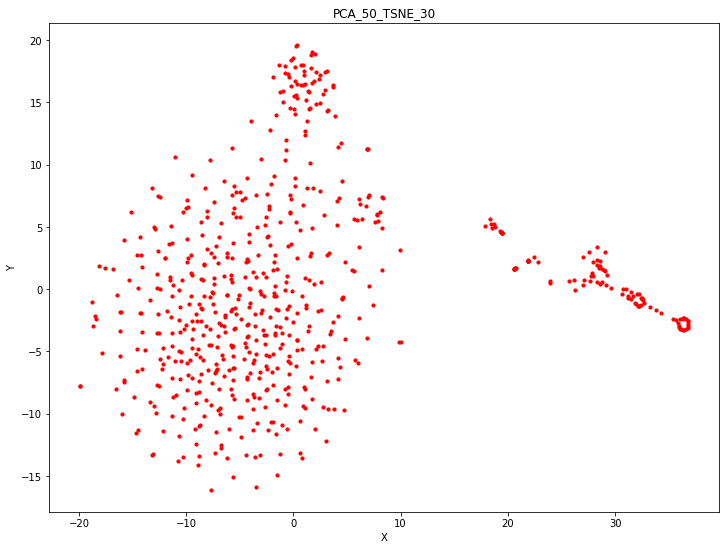

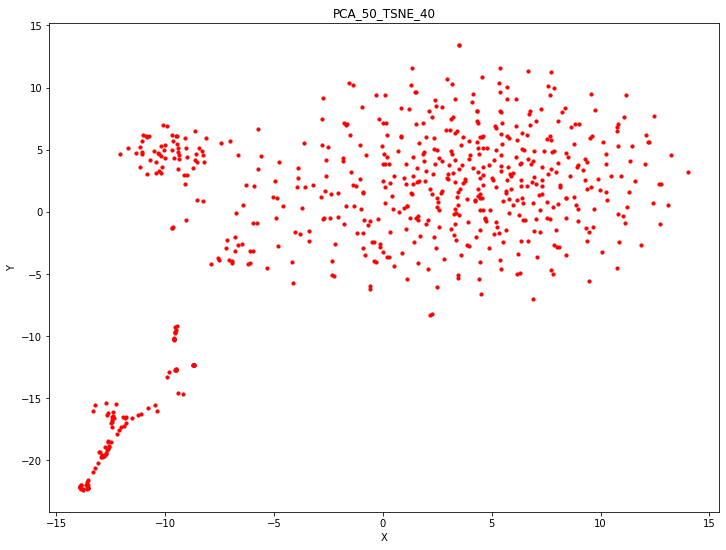

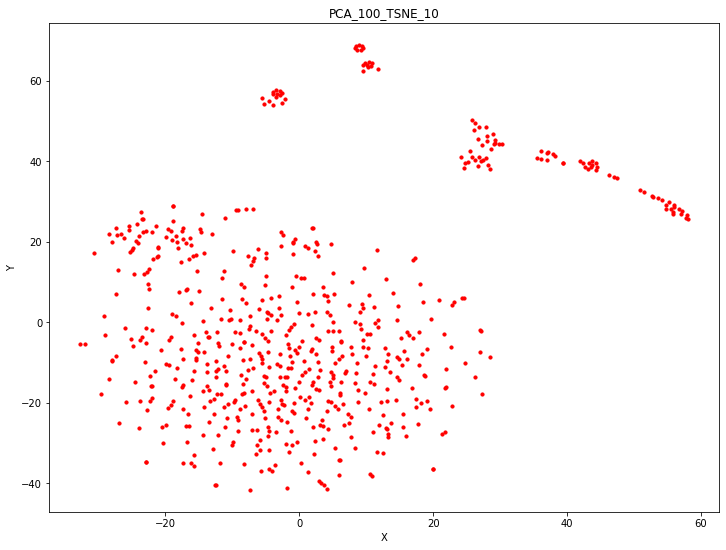

...

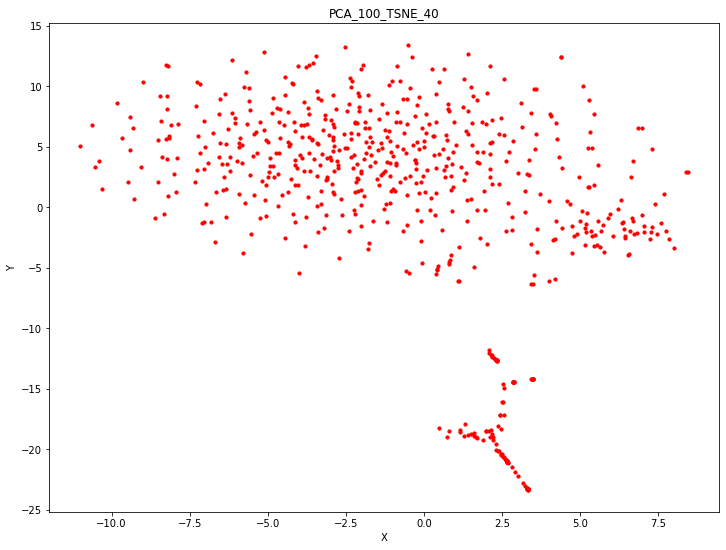

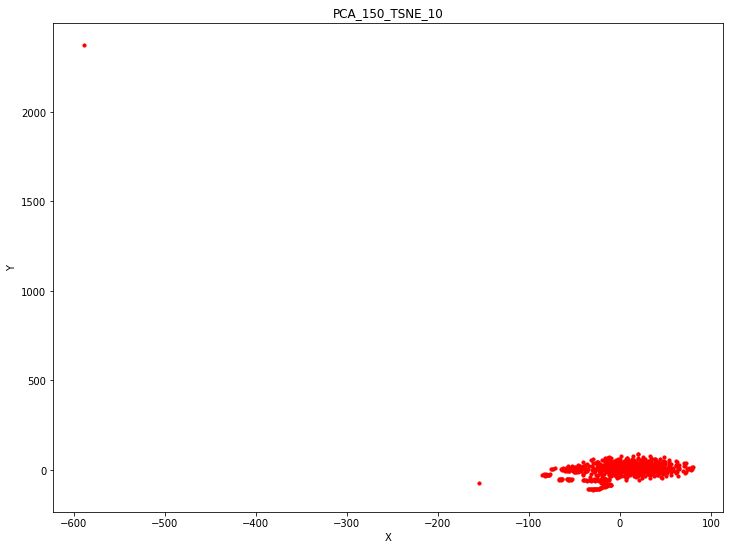

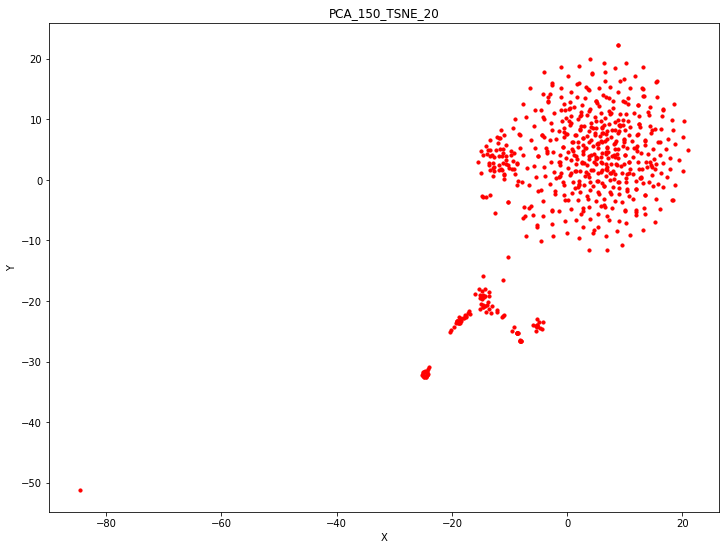

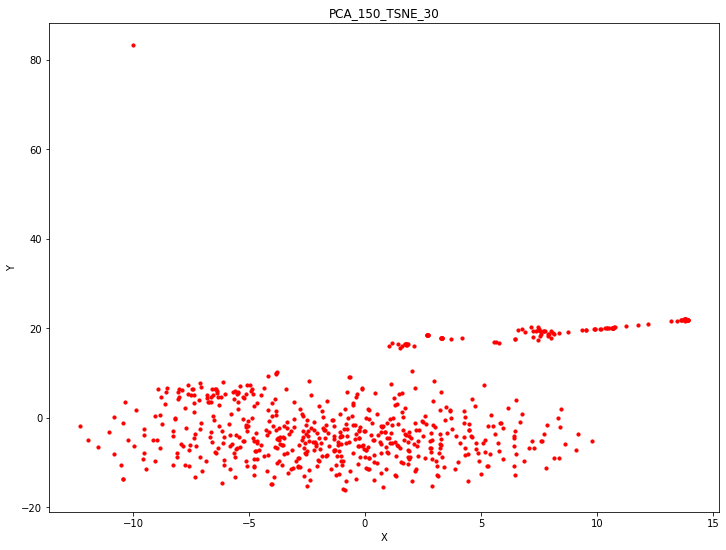

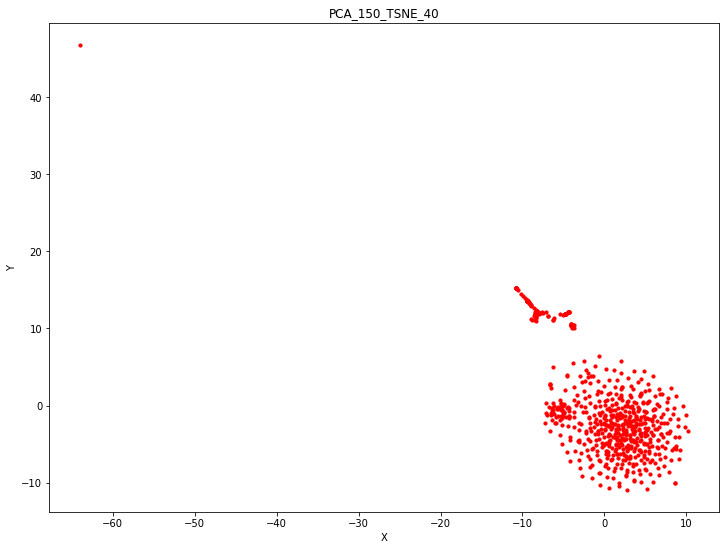

In [11]:
for n_components in range(50, 200, 50):
    pca = PCA(n_components=n_components)
    data_pca = pca.fit_transform(data)
    for perplexity in range(10, 50, 10):
        tsne = TSNE(n_components=2, perplexity=perplexity)
        data_tsne = tsne.fit_transform(data_pca)
        fig = plt.figure(figsize=(12,9))
        plt.scatter(data_tsne[:, 0], data_tsne[:, 1], s=10, c='r')
        plt.title('PCA_{}_TSNE_{}'.format(str(n_components), str(perplexity)))
        plt.xlabel('X')
        plt.ylabel('Y')
        np.save('./spss_gwas2/All/PCA_{}_TSNE_{}'
                .format(str(n_components), str(perplexity)), data_tsne)
    

# AutoEncoder

In [13]:
from keras.models import Model
from keras.layers import *
import keras.backend as K
from keras.losses import mse, binary_crossentropy

Using TensorFlow backend.









Epoch 1/100





651/651 [==============================] - 1s 854us/step - loss: 1.2516
Epoch 2/100
651/651 [==============================] - 0s 21us/step - loss: 1.2508
Epoch 3/100
651/651 [==============================] - 0s 25us/step - loss: 1.2502
Epoch 4/100
651/651 [==============================] - 0s 23us/step - loss: 1.2498
Epoch 5/100
651/651 [==============================] - 0s 23us/step - loss: 1.2495
Epoch 6/100
651/651 [==============================] - 0s 24us/step - loss: 1.2492
Epoch 7/100
651/651 [==============================] - 0s 21us/step - loss: 1.2490
Epoch 8/100
651/651 [==============================] - 0s 22us/step - loss: 1.2487
Epoch 9/100
651/651 [==============================] - 0s 20us/step - loss: 1.2483
Epoch 10/100
651/651 [==============================] - 0s 23us/step - loss: 1.2480
Epoch 11/100
651/651 [==============================] - 0s 23us/step - loss: 1.2475
Epoch 12/100
651/651 [==============================] - 0s 23us/step - l

651/651 [==============================] - 0s 23us/step - loss: 1.1650
Epoch 72/100
651/651 [==============================] - 0s 23us/step - loss: 1.1640
Epoch 73/100
651/651 [==============================] - 0s 23us/step - loss: 1.1630
Epoch 74/100
651/651 [==============================] - 0s 22us/step - loss: 1.1621
Epoch 75/100
651/651 [==============================] - 0s 21us/step - loss: 1.1612
Epoch 76/100
651/651 [==============================] - 0s 22us/step - loss: 1.1604
Epoch 77/100
651/651 [==============================] - 0s 21us/step - loss: 1.1595
Epoch 78/100
651/651 [==============================] - 0s 21us/step - loss: 1.1587
Epoch 79/100
651/651 [==============================] - 0s 23us/step - loss: 1.1579
Epoch 80/100
651/651 [==============================] - 0s 23us/step - loss: 1.1571
Epoch 81/100
651/651 [==============================] - 0s 22us/step - loss: 1.1564
Epoch 82/100
651/651 [==============================] - 0s 23us/step - loss: 1.1556
Epoch

Epoch 69/100
651/651 [==============================] - 0s 23us/step - loss: 1.1520
Epoch 70/100
651/651 [==============================] - 0s 26us/step - loss: 1.1511
Epoch 71/100
651/651 [==============================] - 0s 23us/step - loss: 1.1503
Epoch 72/100
651/651 [==============================] - 0s 25us/step - loss: 1.1494
Epoch 73/100
651/651 [==============================] - 0s 23us/step - loss: 1.1486
Epoch 74/100
651/651 [==============================] - 0s 28us/step - loss: 1.1477
Epoch 75/100
651/651 [==============================] - 0s 26us/step - loss: 1.1469
Epoch 76/100
651/651 [==============================] - 0s 25us/step - loss: 1.1461
Epoch 77/100
651/651 [==============================] - 0s 23us/step - loss: 1.1452
Epoch 78/100
651/651 [==============================] - 0s 21us/step - loss: 1.1445
Epoch 79/100
651/651 [==============================] - 0s 21us/step - loss: 1.1437
Epoch 80/100
651/651 [==============================] - 0s 21us/step - loss:

Epoch 67/100
651/651 [==============================] - 0s 26us/step - loss: 1.1284
Epoch 68/100
651/651 [==============================] - 0s 23us/step - loss: 1.1276
Epoch 69/100
651/651 [==============================] - 0s 24us/step - loss: 1.1268
Epoch 70/100
651/651 [==============================] - 0s 26us/step - loss: 1.1261
Epoch 71/100
651/651 [==============================] - 0s 26us/step - loss: 1.1254
Epoch 72/100
651/651 [==============================] - 0s 25us/step - loss: 1.1247
Epoch 73/100
651/651 [==============================] - 0s 25us/step - loss: 1.1240
Epoch 74/100
651/651 [==============================] - 0s 22us/step - loss: 1.1234
Epoch 75/100
651/651 [==============================] - 0s 22us/step - loss: 1.1227
Epoch 76/100
651/651 [==============================] - 0s 23us/step - loss: 1.1221
Epoch 77/100
651/651 [==============================] - 0s 23us/step - loss: 1.1215
Epoch 78/100
651/651 [==============================] - 0s 23us/step - loss:

Epoch 65/100
651/651 [==============================] - 0s 23us/step - loss: 1.1165
Epoch 66/100
651/651 [==============================] - 0s 25us/step - loss: 1.1158
Epoch 67/100
651/651 [==============================] - 0s 26us/step - loss: 1.1152
Epoch 68/100
651/651 [==============================] - 0s 27us/step - loss: 1.1146
Epoch 69/100
651/651 [==============================] - 0s 28us/step - loss: 1.1140
Epoch 70/100
651/651 [==============================] - 0s 23us/step - loss: 1.1134
Epoch 71/100
651/651 [==============================] - 0s 23us/step - loss: 1.1128
Epoch 72/100
651/651 [==============================] - 0s 23us/step - loss: 1.1122
Epoch 73/100
651/651 [==============================] - 0s 21us/step - loss: 1.1117
Epoch 74/100
651/651 [==============================] - 0s 21us/step - loss: 1.1111
Epoch 75/100
651/651 [==============================] - 0s 21us/step - loss: 1.1105
Epoch 76/100
651/651 [==============================] - 0s 22us/step - loss:

651/651 [==============================] - 0s 47us/step - loss: 0.2921
Epoch 58/100
651/651 [==============================] - 0s 43us/step - loss: 0.2777
Epoch 59/100
651/651 [==============================] - 0s 41us/step - loss: 0.2634
Epoch 60/100
651/651 [==============================] - 0s 40us/step - loss: 0.2495
Epoch 61/100
651/651 [==============================] - 0s 41us/step - loss: 0.2359
Epoch 62/100
651/651 [==============================] - 0s 41us/step - loss: 0.2228
Epoch 63/100
651/651 [==============================] - 0s 44us/step - loss: 0.2100
Epoch 64/100
651/651 [==============================] - 0s 41us/step - loss: 0.1975
Epoch 65/100
651/651 [==============================] - 0s 40us/step - loss: 0.1854
Epoch 66/100
651/651 [==============================] - 0s 44us/step - loss: 0.1737
Epoch 67/100
651/651 [==============================] - 0s 40us/step - loss: 0.1625
Epoch 68/100
651/651 [==============================] - 0s 40us/step - loss: 0.1516
Epoch

Epoch 55/100
651/651 [==============================] - 0s 43us/step - loss: 0.0991
Epoch 56/100
651/651 [==============================] - 0s 41us/step - loss: 0.0899
Epoch 57/100
651/651 [==============================] - 0s 44us/step - loss: 0.0814
Epoch 58/100
651/651 [==============================] - 0s 40us/step - loss: 0.0734
Epoch 59/100
651/651 [==============================] - 0s 40us/step - loss: 0.0657
Epoch 60/100
651/651 [==============================] - 0s 40us/step - loss: 0.0583
Epoch 61/100
651/651 [==============================] - 0s 41us/step - loss: 0.0510
Epoch 62/100
651/651 [==============================] - 0s 40us/step - loss: 0.0440
Epoch 63/100
651/651 [==============================] - 0s 41us/step - loss: 0.0371
Epoch 64/100
651/651 [==============================] - 0s 43us/step - loss: 0.0304
Epoch 65/100
651/651 [==============================] - 0s 41us/step - loss: 0.0239
Epoch 66/100
651/651 [==============================] - 0s 44us/step - loss:

Epoch 53/100
651/651 [==============================] - 0s 42us/step - loss: -0.0625
Epoch 54/100
651/651 [==============================] - 0s 40us/step - loss: -0.0642
Epoch 55/100
651/651 [==============================] - 0s 44us/step - loss: -0.0659
Epoch 56/100
651/651 [==============================] - 0s 41us/step - loss: -0.0688
Epoch 57/100
651/651 [==============================] - 0s 41us/step - loss: -0.0730
Epoch 58/100
651/651 [==============================] - 0s 43us/step - loss: -0.0779
Epoch 59/100
651/651 [==============================] - 0s 43us/step - loss: -0.0829
Epoch 60/100
651/651 [==============================] - 0s 39us/step - loss: -0.0873
Epoch 61/100
651/651 [==============================] - 0s 43us/step - loss: -0.0901
Epoch 62/100
651/651 [==============================] - 0s 47us/step - loss: -0.0919
Epoch 63/100
651/651 [==============================] - 0s 41us/step - loss: -0.0933
Epoch 64/100
651/651 [==============================] - 0s 41us/s

Epoch 50/100
651/651 [==============================] - 0s 44us/step - loss: -0.0966
Epoch 51/100
651/651 [==============================] - 0s 42us/step - loss: -0.0979
Epoch 52/100
651/651 [==============================] - 0s 45us/step - loss: -0.0992
Epoch 53/100
651/651 [==============================] - 0s 43us/step - loss: -0.1011
Epoch 54/100
651/651 [==============================] - 0s 43us/step - loss: -0.1037
Epoch 55/100
651/651 [==============================] - 0s 41us/step - loss: -0.1073
Epoch 56/100
651/651 [==============================] - 0s 44us/step - loss: -0.1114
Epoch 57/100
651/651 [==============================] - 0s 40us/step - loss: -0.1160
Epoch 58/100
651/651 [==============================] - 0s 43us/step - loss: -0.1208
Epoch 59/100
651/651 [==============================] - 0s 43us/step - loss: -0.1254
Epoch 60/100
651/651 [==============================] - 0s 40us/step - loss: -0.1296
Epoch 61/100
651/651 [==============================] - 0s 43us/s

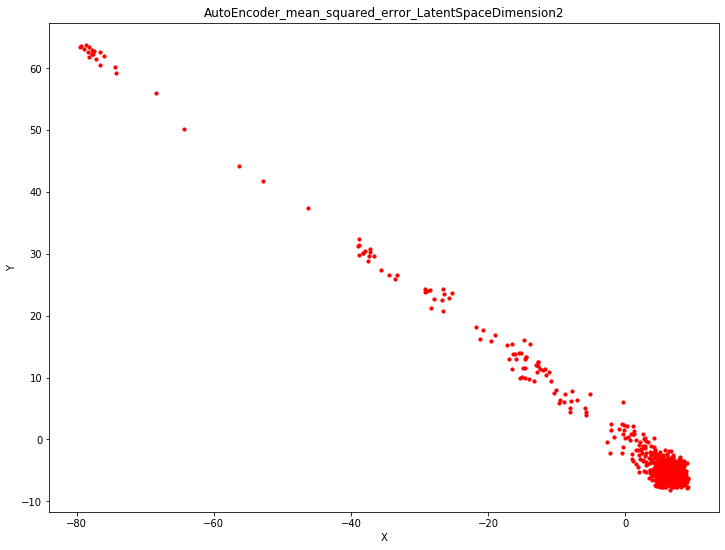

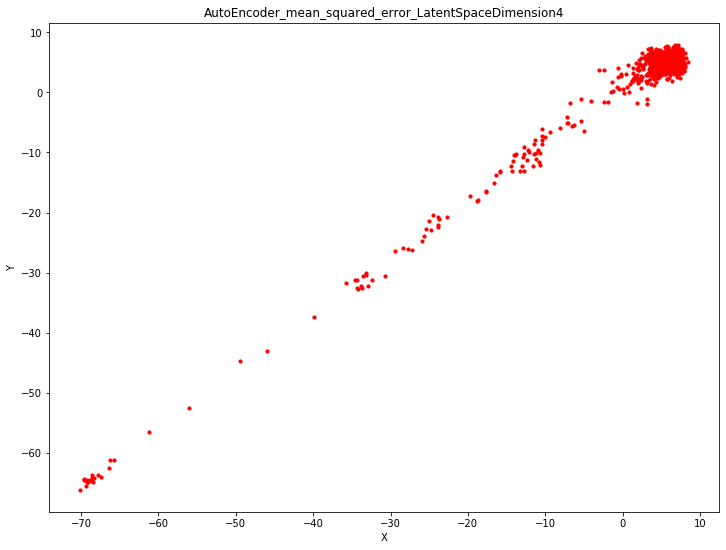

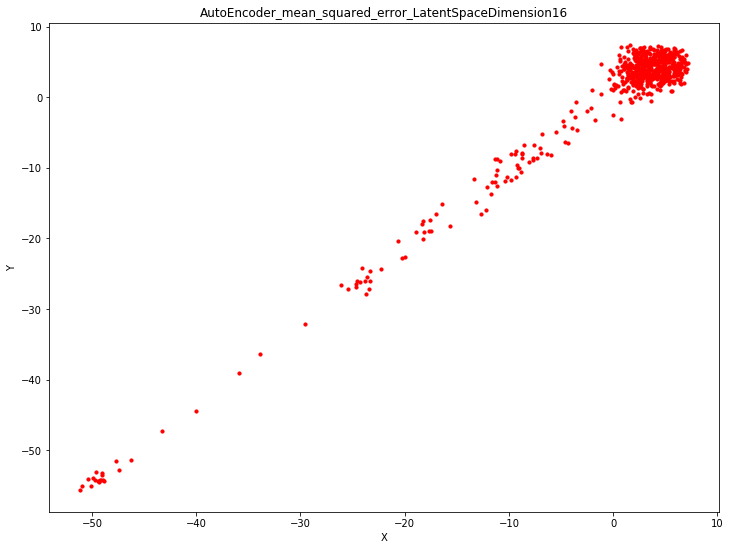

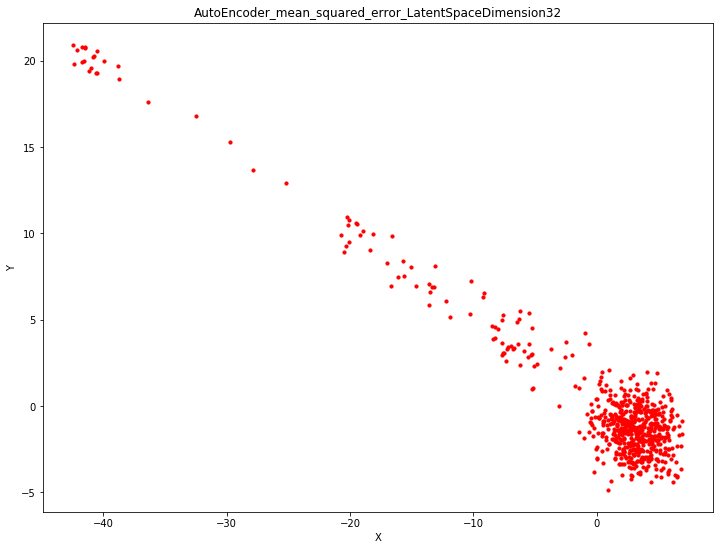

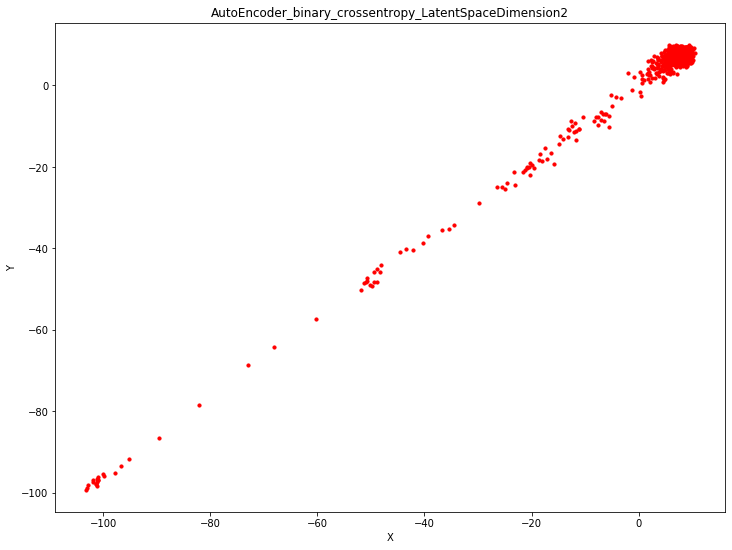

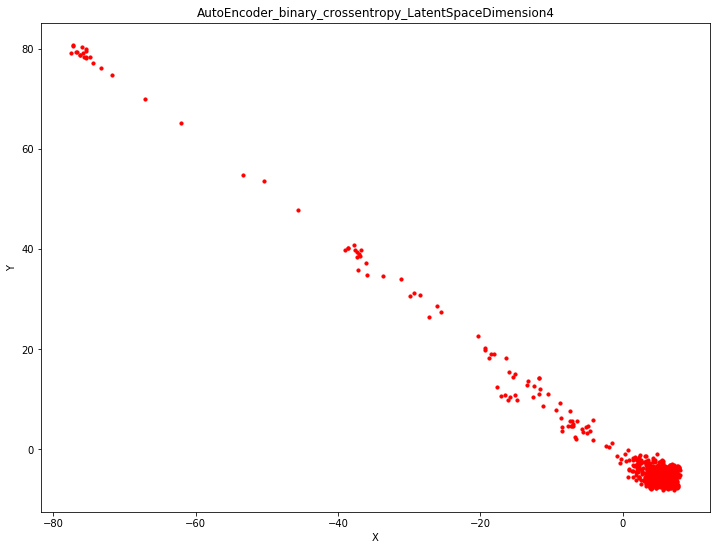

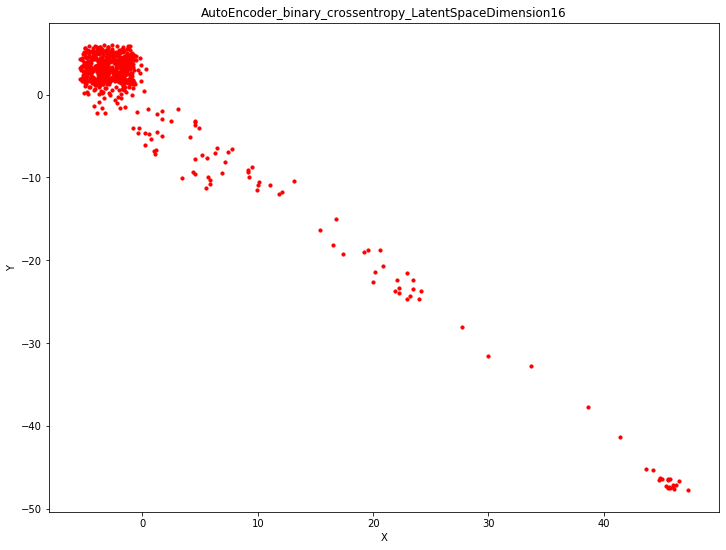

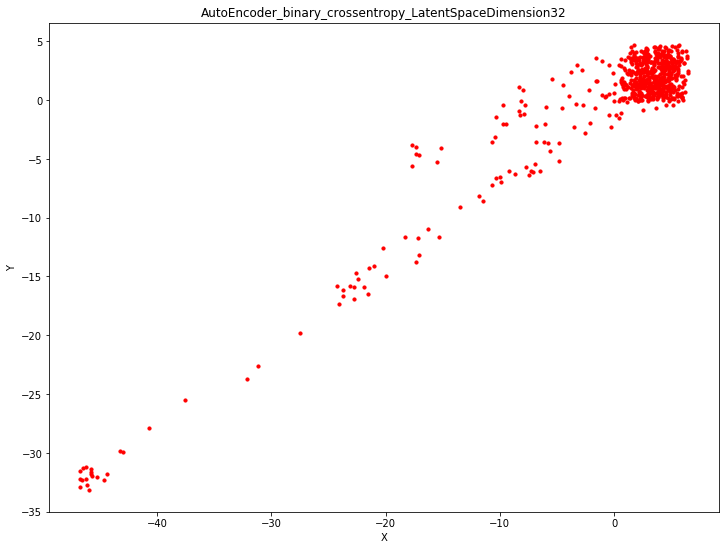

In [14]:
for loss in [mse, binary_crossentropy]:
    for dimension in [2, 4, 16, 32]:
        input_data = Input(shape=(data.shape[0],))
        encoded = Dense(units=dimension, activation=None)(input_data)
        decoded = Dense(units=data.shape[0], activation='sigmoid')(encoded)
        autoencoder=Model(input_data, decoded)
        encoder = Model(input_data, encoded)
        autoencoder.compile(optimizer='adam', loss=loss)
        autoencoder.fit(data,data,epochs=100,batch_size=data.shape[0],shuffle=False)
        
        data_ae = encoder.predict(data)
        fig = plt.figure(figsize=(12, 9))
        plt.scatter(data_ae[:, 0], data_ae[:, 1], s=10, c='r')
        plt.title('AutoEncoder_{}_LatentSpaceDimension{}'.format(str(loss.__name__), str(dimension)))
        plt.xlabel('X')
        plt.ylabel('Y')
        np.save('./spss_gwas2/All/AutoEncoder_{}_LatentSpaceDimension{}'
                .format(str(loss.__name__), str(dimension)), data_ae)

## Variational AutoEncoder


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
encoder_input (InputLayer)   (None, 651)               0         
_________________________________________________________________
encoder (Model)              [(None, 2), (None, 2), (N 20996     
_________________________________________________________________
decoder (Model)              (None, 651)               21579     
Total params: 42,575
Trainable params: 42,575
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
651/651 [==============================] - 1s 892us/step - loss: 816.2542
Epoch 2/100
651/651 [==============================] - 0s 20us/step - loss: 815.0171
Epoch 3/100
651/651 [==============================] - 0s 20us/step - loss: 813.8514
Epoch 4/100
651/651 [==============================] - 0s 19us/step - loss: 812.5273
Epoch 5/100
651/651 [==============================] - 0s 18

Epoch 86/100
651/651 [==============================] - 0s 20us/step - loss: 651.1655
Epoch 87/100
651/651 [==============================] - 0s 21us/step - loss: 650.5782
Epoch 88/100
651/651 [==============================] - 0s 19us/step - loss: 650.3391
Epoch 89/100
651/651 [==============================] - 0s 20us/step - loss: 650.1812
Epoch 90/100
651/651 [==============================] - 0s 20us/step - loss: 649.5983
Epoch 91/100
651/651 [==============================] - 0s 18us/step - loss: 649.1879
Epoch 92/100
651/651 [==============================] - 0s 18us/step - loss: 649.0919
Epoch 93/100
651/651 [==============================] - 0s 21us/step - loss: 648.6602
Epoch 94/100
651/651 [==============================] - 0s 18us/step - loss: 648.4293
Epoch 95/100
651/651 [==============================] - 0s 21us/step - loss: 648.1368
Epoch 96/100
651/651 [==============================] - 0s 19us/step - loss: 647.7402
Epoch 97/100
651/651 [==============================] 

Epoch 73/100
651/651 [==============================] - 0s 21us/step - loss: 664.8987
Epoch 74/100
651/651 [==============================] - 0s 21us/step - loss: 663.9107
Epoch 75/100
651/651 [==============================] - 0s 21us/step - loss: 663.3652
Epoch 76/100
651/651 [==============================] - 0s 20us/step - loss: 661.9128
Epoch 77/100
651/651 [==============================] - 0s 21us/step - loss: 661.8984
Epoch 78/100
651/651 [==============================] - 0s 20us/step - loss: 661.4275
Epoch 79/100
651/651 [==============================] - 0s 20us/step - loss: 660.1622
Epoch 80/100
651/651 [==============================] - 0s 20us/step - loss: 659.0082
Epoch 81/100
651/651 [==============================] - 0s 20us/step - loss: 657.8394
Epoch 82/100
651/651 [==============================] - 0s 20us/step - loss: 657.2589
Epoch 83/100
651/651 [==============================] - 0s 21us/step - loss: 656.0988
Epoch 84/100
651/651 [==============================] 

Epoch 60/100
651/651 [==============================] - 0s 29us/step - loss: 644.3875
Epoch 61/100
651/651 [==============================] - 0s 26us/step - loss: 644.4423
Epoch 62/100
651/651 [==============================] - 0s 26us/step - loss: 643.8376
Epoch 63/100
651/651 [==============================] - 0s 25us/step - loss: 643.3953
Epoch 64/100
651/651 [==============================] - 0s 27us/step - loss: 642.8400
Epoch 65/100
651/651 [==============================] - 0s 27us/step - loss: 642.4809
Epoch 66/100
651/651 [==============================] - 0s 25us/step - loss: 642.5690
Epoch 67/100
651/651 [==============================] - 0s 27us/step - loss: 642.3311
Epoch 68/100
651/651 [==============================] - 0s 26us/step - loss: 641.8034
Epoch 69/100
651/651 [==============================] - 0s 28us/step - loss: 641.4958
Epoch 70/100
651/651 [==============================] - 0s 26us/step - loss: 641.0778
Epoch 71/100
651/651 [==============================] 

Epoch 47/100
651/651 [==============================] - 0s 60us/step - loss: 641.5311
Epoch 48/100
651/651 [==============================] - 0s 67us/step - loss: 640.7850
Epoch 49/100
651/651 [==============================] - 0s 60us/step - loss: 640.6142
Epoch 50/100
651/651 [==============================] - 0s 69us/step - loss: 639.8889
Epoch 51/100
651/651 [==============================] - 0s 41us/step - loss: 639.7463
Epoch 52/100
651/651 [==============================] - 0s 55us/step - loss: 639.1009
Epoch 53/100
651/651 [==============================] - 0s 47us/step - loss: 638.6573
Epoch 54/100
651/651 [==============================] - 0s 46us/step - loss: 638.5037
Epoch 55/100
651/651 [==============================] - 0s 45us/step - loss: 637.9141
Epoch 56/100
651/651 [==============================] - 0s 47us/step - loss: 637.6974
Epoch 57/100
651/651 [==============================] - 0s 60us/step - loss: 637.5394
Epoch 58/100
651/651 [==============================] 

Epoch 34/100
651/651 [==============================] - 0s 48us/step - loss: -114.3850
Epoch 35/100
651/651 [==============================] - 0s 57us/step - loss: -133.8725
Epoch 36/100
651/651 [==============================] - 0s 53us/step - loss: -153.9458
Epoch 37/100
651/651 [==============================] - 0s 110us/step - loss: -166.5709
Epoch 38/100
651/651 [==============================] - 0s 60us/step - loss: -180.0636
Epoch 39/100
651/651 [==============================] - 0s 114us/step - loss: -195.8854
Epoch 40/100
651/651 [==============================] - 0s 86us/step - loss: -206.5781
Epoch 41/100
651/651 [==============================] - 0s 52us/step - loss: -220.9406
Epoch 42/100
651/651 [==============================] - 0s 51us/step - loss: -231.0394
Epoch 43/100
651/651 [==============================] - 0s 58us/step - loss: -243.8053
Epoch 44/100
651/651 [==============================] - 0s 61us/step - loss: -254.2342
Epoch 45/100
651/651 [===================

651/651 [==============================] - 0s 44us/step - loss: 201.0480
Epoch 21/100
651/651 [==============================] - 0s 46us/step - loss: 164.1141
Epoch 22/100
651/651 [==============================] - 0s 44us/step - loss: 133.4084
Epoch 23/100
651/651 [==============================] - 0s 44us/step - loss: 96.3047
Epoch 24/100
651/651 [==============================] - 0s 45us/step - loss: 56.0928
Epoch 25/100
651/651 [==============================] - 0s 46us/step - loss: 25.4507
Epoch 26/100
651/651 [==============================] - 0s 48us/step - loss: -9.4296
Epoch 27/100
651/651 [==============================] - 0s 44us/step - loss: -40.5983
Epoch 28/100
651/651 [==============================] - 0s 46us/step - loss: -73.2217
Epoch 29/100
651/651 [==============================] - 0s 44us/step - loss: -98.6201
Epoch 30/100
651/651 [==============================] - 0s 47us/step - loss: -121.0213
Epoch 31/100
651/651 [==============================] - 0s 49us/step -

Epoch 7/100
651/651 [==============================] - 0s 49us/step - loss: 401.3828
Epoch 8/100
651/651 [==============================] - 0s 47us/step - loss: 383.2562
Epoch 9/100
651/651 [==============================] - 0s 51us/step - loss: 361.4773
Epoch 10/100
651/651 [==============================] - 0s 49us/step - loss: 334.1595
Epoch 11/100
651/651 [==============================] - 0s 49us/step - loss: 301.4783
Epoch 12/100
651/651 [==============================] - 0s 46us/step - loss: 267.2027
Epoch 13/100
651/651 [==============================] - 0s 51us/step - loss: 226.0290
Epoch 14/100
651/651 [==============================] - 0s 46us/step - loss: 181.9228
Epoch 15/100
651/651 [==============================] - 0s 49us/step - loss: 133.5903
Epoch 16/100
651/651 [==============================] - 0s 45us/step - loss: 80.7951
Epoch 17/100
651/651 [==============================] - 0s 50us/step - loss: 31.2356
Epoch 18/100
651/651 [==============================] - 0s 

Epoch 1/100
651/651 [==============================] - 2s 2ms/step - loss: 455.8867
Epoch 2/100
651/651 [==============================] - 0s 62us/step - loss: 448.0496
Epoch 3/100
651/651 [==============================] - 0s 66us/step - loss: 439.3010
Epoch 4/100
651/651 [==============================] - 0s 79us/step - loss: 427.0927
Epoch 5/100
651/651 [==============================] - 0s 70us/step - loss: 409.9464
Epoch 6/100
651/651 [==============================] - 0s 70us/step - loss: 385.5677
Epoch 7/100
651/651 [==============================] - 0s 71us/step - loss: 353.6849
Epoch 8/100
651/651 [==============================] - 0s 70us/step - loss: 316.7689
Epoch 9/100
651/651 [==============================] - 0s 70us/step - loss: 272.9066
Epoch 10/100
651/651 [==============================] - 0s 73us/step - loss: 221.3626
Epoch 11/100
651/651 [==============================] - 0s 71us/step - loss: 165.0867
Epoch 12/100
651/651 [==============================] - 0s 84us/

Epoch 96/100
651/651 [==============================] - 0s 60us/step - loss: -976.9766
Epoch 97/100
651/651 [==============================] - 0s 59us/step - loss: -979.4304
Epoch 98/100
651/651 [==============================] - 0s 61us/step - loss: -981.4528
Epoch 99/100
651/651 [==============================] - 0s 61us/step - loss: -982.9728
Epoch 100/100
651/651 [==============================] - 0s 57us/step - loss: -985.0372


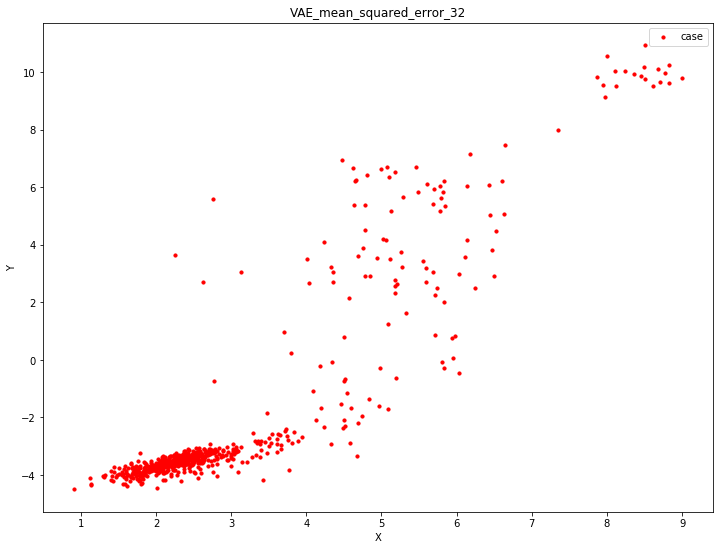

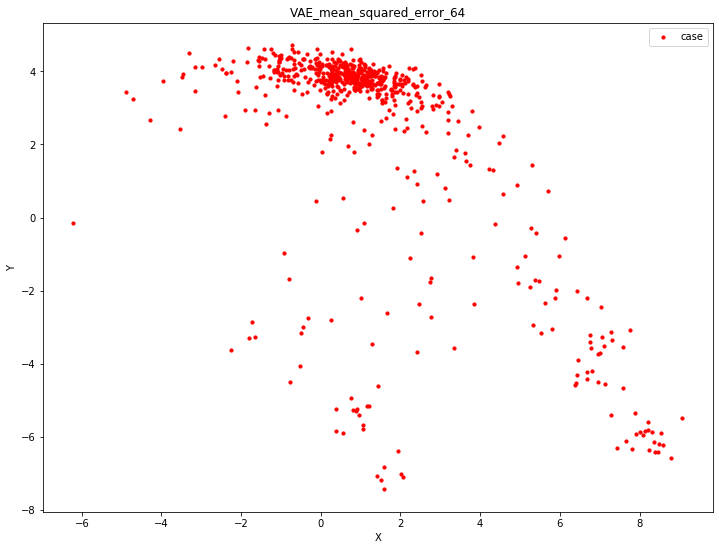

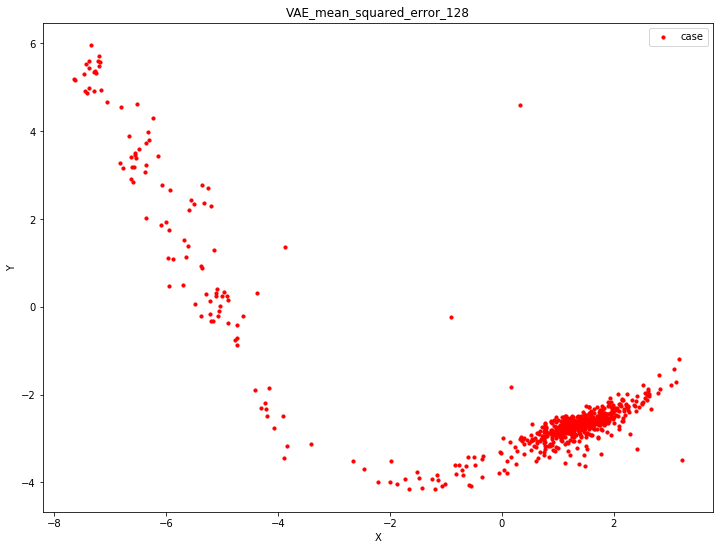

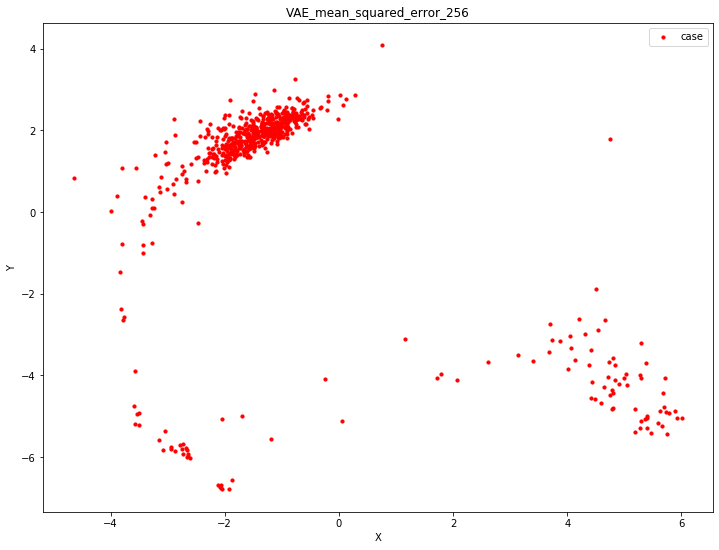

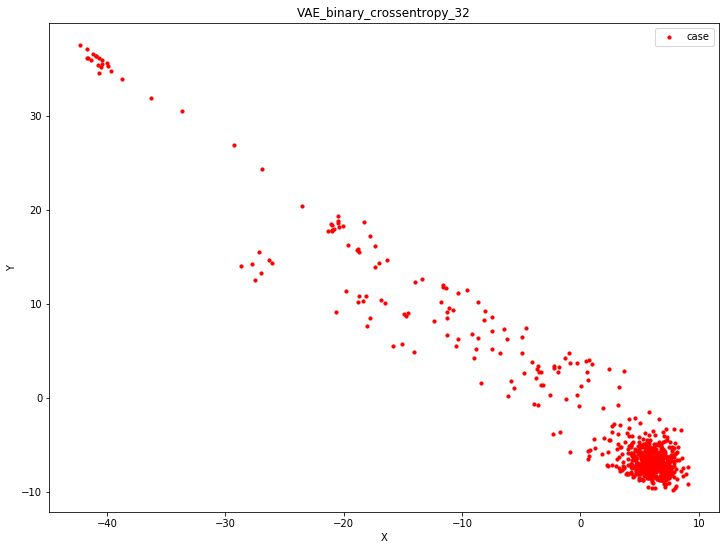

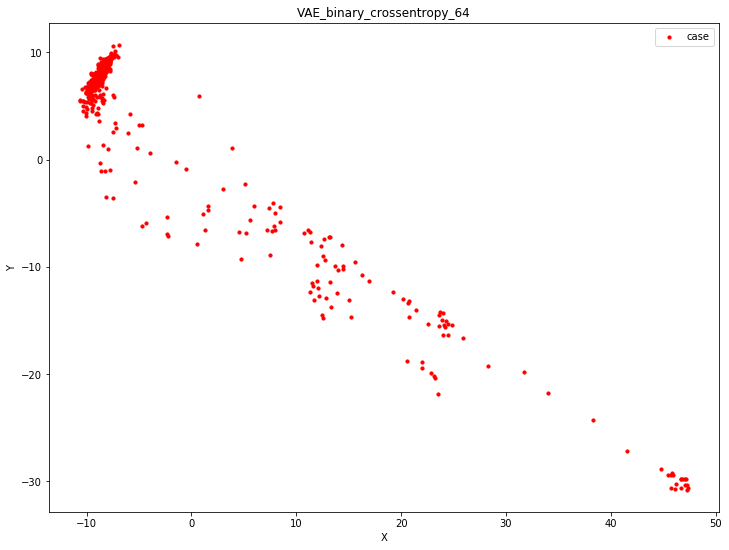

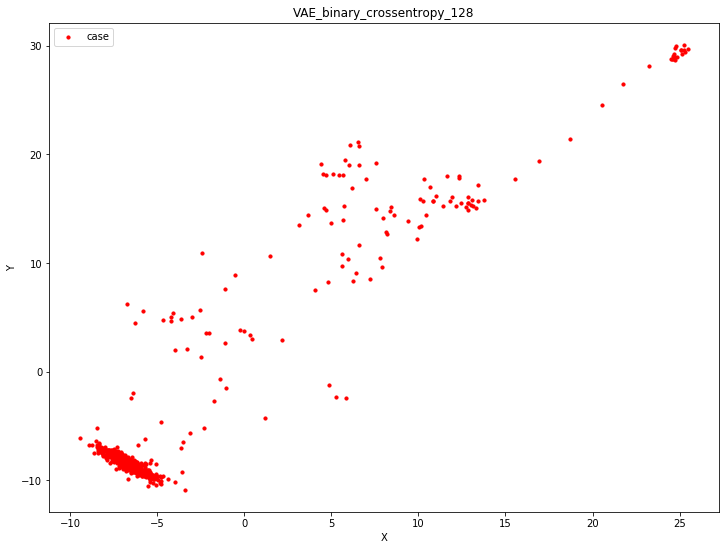

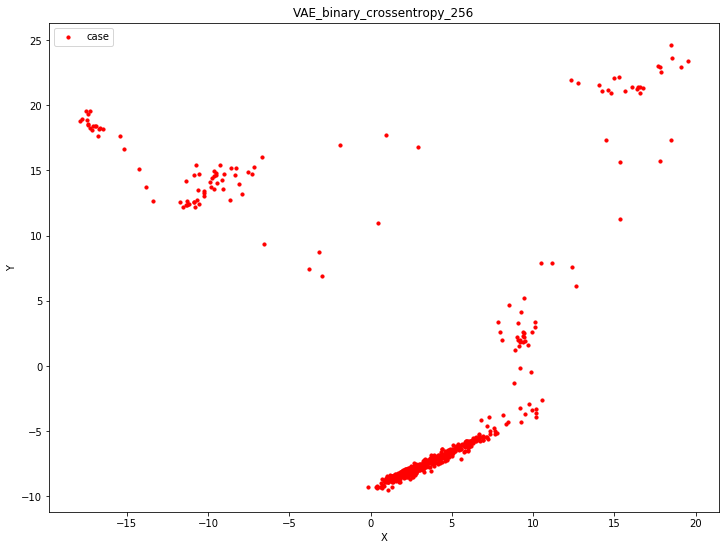

In [15]:
def sampling(args):
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

for loss in [mse, binary_crossentropy]:
    for intermediate_dim in [32, 64, 128, 256]:
        input_shape = (data.shape[0],)
        original_dim = data.shape[0]
        intermediate_dim = intermediate_dim
        latent_dim = 2
        inputs = Input(shape=input_shape, name='encoder_input')
        x = Dense(intermediate_dim, activation='relu')(inputs)
        z_mean = Dense(latent_dim, name='z_mean')(x)
        z_log_var = Dense(latent_dim, name='z_log_var')(x)

        z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])
        encoder = Model(inputs, [z_mean, z_log_var, z], name='encoder')

        latent_inputs = Input(shape=(latent_dim,), name='z_sampling')
        x = Dense(intermediate_dim, activation='relu')(latent_inputs)
        outputs = Dense(original_dim, activation='sigmoid')(x)

        decoder = Model(latent_inputs, outputs, name='decoder')

        outputs = decoder(encoder(inputs)[2])
        vae = Model(inputs, outputs, name='vae')
        reconstruction_loss = loss(inputs, outputs)
        reconstruction_loss *= original_dim
        kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
        kl_loss = K.sum(kl_loss, axis=-1)
        kl_loss *= -0.5
        vae_loss = K.mean(reconstruction_loss + kl_loss)
        vae.add_loss(vae_loss)
        vae.compile(optimizer='adam')
        vae.summary()
        vae.fit(data, epochs=100, batch_size=data.shape[0])
        
        z_mean, _, z = encoder.predict(data)
        fig = plt.figure(figsize=(12, 9))
        plt.scatter(z_mean[:, 0], z_mean[:, 1], s=10, c='r', label='case')
        plt.title('VAE_{}_{}'.format(str(loss.__name__), str(intermediate_dim)))
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.legend()
        np.save('./spss_gwas2/All/VAE_{}_{}'.format(str(loss.__name__), str(intermediate_dim)), z_mean)